In [3]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from ucimlrepo import fetch_ucirepo 

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, max_error
from sklearn.model_selection import validation_curve

from sklearn.neighbors import KNeighborsRegressor

from sklearn.tree import DecisionTreeRegressor, plot_tree, export_text

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV, Lasso,LassoCV

from sklearn.decomposition import PCA

import seaborn as sns

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

np.random.seed(42)
pd.set_option("display.max_colwidth", 120)


Using device: cuda


# 1. DATASET ED E.D.A.

IMPORTO IL DATASET DALLA REPOSITORY DI UCI E VISUALIZZO LA STRUTTURA

In [55]:
infrared_thermography_temperature = fetch_ucirepo(id=925)
X = infrared_thermography_temperature.data.features
y = infrared_thermography_temperature.data.targets

# --- copia delle colonne categoriche ORIGINALI (indicizzate come il dataset di partenza)
#     servira per analizzare l'errore per fascia d'eta ed etnia sul test set
X_cat_original = X[['Age', 'Ethnicity', 'Gender','Humidity']].copy()


In [5]:
print("--- Prime 2 righe delle features ---")
display(X.head(2))

print("\n--- Dimensioni del dataset (righe, colonne) ---")
display(X.shape)

print("\n--- Informazioni sul dataset (INFO, NULLI E DESCRIZIONE STATISTICA)---")
display(X.info())
display(X.describe())

display(X.isna().sum())

--- Prime 2 righe delle features ---


,Gender,Age,Ethnicity,T_atm,Humidity,Distance,T_offset1,Max1R13_1,Max1L13_1,aveAllR13_1,...,T_FHCC1,T_FHRC1,T_FHLC1,T_FHBC1,T_FHTC1,T_FH_Max1,T_FHC_Max1,T_Max1,T_OR1,T_OR_Max1
0,Male,41-50,White,24.0,28.0,0.8,0.7025,35.03,35.3775,34.40,...,33.5775,33.4775,33.3725,33.4925,33.0025,34.5300,34.0075,35.6925,35.6350,35.6525
1,Female,31-40,Black or African-American,24.0,26.0,0.8,0.7800,34.55,34.5200,33.93,...,34.0325,34.0550,33.6775,33.9700,34.0025,34.6825,34.6600,35.1750,35.0925,35.1075



--- Dimensioni del dataset (righe, colonne) ---


(1020, 33)


--- Informazioni sul dataset (INFO, NULLI E DESCRIZIONE STATISTICA)---
<class 'pandas.DataFrame'>
RangeIndex: 1020 entries, 0 to 1019
Data columns (total 33 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Gender       1020 non-null   str    
 1   Age          1020 non-null   str    
 2   Ethnicity    1020 non-null   str    
 3   T_atm        1020 non-null   float64
 4   Humidity     1020 non-null   float64
 5   Distance     1018 non-null   float64
 6   T_offset1    1020 non-null   float64
 7   Max1R13_1    1020 non-null   float64
 8   Max1L13_1    1020 non-null   float64
 9   aveAllR13_1  1020 non-null   float64
 10  aveAllL13_1  1020 non-null   float64
 11  T_RC1        1020 non-null   float64
 12  T_RC_Dry1    1020 non-null   float64
 13  T_RC_Wet1    1020 non-null   float64
 14  T_RC_Max1    1020 non-null   float64
 15  T_LC1        1020 non-null   float64
 16  T_LC_Dry1    1020 non-null   float64
 17  T_LC_Wet1    1020 non-null   

None

,T_atm,Humidity,Distance,T_offset1,Max1R13_1,Max1L13_1,aveAllR13_1,aveAllL13_1,T_RC1,T_RC_Dry1,...,T_FHCC1,T_FHRC1,T_FHLC1,T_FHBC1,T_FHTC1,T_FH_Max1,T_FHC_Max1,T_Max1,T_OR1,T_OR_Max1
count,1020.000000,1020.000000,1018.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,...,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000
mean,24.115392,28.723039,0.729784,0.968648,35.596533,35.611474,34.888475,35.011345,35.659921,35.587143,...,34.573865,34.567782,34.565340,34.487701,34.577293,35.421555,35.094144,36.084785,35.805519,35.838277
std,1.336338,13.071627,2.456486,0.362587,0.574888,0.549760,0.718613,0.633836,0.553897,0.569278,...,0.672461,0.669410,0.678663,0.668065,0.728678,0.523477,0.576045,0.491821,0.559258,0.559316
min,20.200000,9.900000,0.540000,-0.590000,33.897500,34.122500,31.770000,32.902500,33.985000,33.825000,...,31.050000,31.452500,31.657500,31.280000,31.150000,33.407500,32.440000,34.892500,33.802500,33.835000
25%,23.400000,17.600000,0.600000,0.772500,35.247500,35.271875,34.456250,34.651250,35.332500,35.249375,...,34.213125,34.180000,34.177500,34.096875,34.225000,35.116875,34.756458,35.775000,35.474375,35.500000
50%,24.000000,26.300000,0.620000,0.940000,35.548750,35.575000,34.915000,34.997500,35.602500,35.533750,...,34.605000,34.597500,34.602500,34.512917,34.622500,35.391250,35.100000,36.027500,35.790000,35.825000
75%,24.700000,36.200000,0.700000,1.140000,35.872500,35.883125,35.300000,35.363125,35.910625,35.855625,...,34.965625,34.968125,34.965000,34.878125,35.012500,35.675000,35.415000,36.280000,36.087500,36.120625
max,29.100000,61.200000,79.000000,2.875000,38.405000,38.042500,37.575000,37.680000,38.385000,38.380000,...,37.125000,37.075000,37.165000,37.212500,37.367500,38.002500,37.632500,38.807500,38.417500,38.455000


Gender         0
Age            0
Ethnicity      0
T_atm          0
Humidity       0
Distance       2
T_offset1      0
Max1R13_1      0
Max1L13_1      0
aveAllR13_1    0
aveAllL13_1    0
T_RC1          0
T_RC_Dry1      0
T_RC_Wet1      0
T_RC_Max1      0
T_LC1          0
T_LC_Dry1      0
T_LC_Wet1      0
T_LC_Max1      0
RCC1           0
LCC1           0
canthiMax1     0
canthi4Max1    0
T_FHCC1        0
T_FHRC1        0
T_FHLC1        0
T_FHBC1        0
T_FHTC1        0
T_FH_Max1      0
T_FHC_Max1     0
T_Max1         0
T_OR1          0
T_OR_Max1      0
dtype: int64

Nella visualizzazione ci accorgiamo che sono presenti 3 colonne di tipo categorico e 30 di tipo continuo, per un totale di 33. Si rilevo nella colonna relativa alle distanze (Distance), due dati nulli. La distanza delle misurazioni nell'esperimento, come vedremo in seguito dagli istogrammi della popolazione del dataset, è fisso a 1m. Tuttavia, non sapendo perchè la registrazione del dato è errata, in abbondanza di campioni (1020), si è deciso di rimuoverli.
Si è proceduto a fare encoding delle 3 colonne di tipo categorico.
Tramite il preprocessor si sono generate:
- 1 colonna age in cui venivano numerate le fasce d'età in ordine crescente
- 1 colonna per ogni genere ed etnia di tipo booleano (scelta fatta in assenza di una cardinalità delle seguenti categorie).
Le colonne prodotte per genere sono state ridotte solo a una colonna Female (booleana), dato che la colonna Male sarebbe risultata ridondante.
Le colonne prodotte per etnia sono state rinominate con nomi piu indicativi e di facile comprensione.   {RIVEDI age prima riga transformer}

In [6]:
def _age_key(s):
    nums = re.findall(r'\d+', str(s))
    return int(nums[0]) if nums else 10**9

age_order = sorted(X['Age'].dropna().unique().tolist(), key=_age_key)
print("Ordine età:", age_order)

Ordine età: ['18-20', '21-30', '21-25', '26-30', '31-40', '41-50', '51-60', '>60']


In [7]:
preprocessor = ColumnTransformer(
    transformers=[
        ('age', OrdinalEncoder(categories=[age_order]), ['Age']),
        ('cat', OneHotEncoder(sparse_output=False, drop='first'), ['Gender', 'Ethnicity'])
    ],
    remainder='passthrough'
)

# 3. Trasformazione
X_trasformato = preprocessor.fit_transform(X)
nomi_colonne = preprocessor.get_feature_names_out()

df = pd.DataFrame(X_trasformato, columns=nomi_colonne)

mapping = {
    'cat__Gender_Female': 'Female',
    'age__Age': 'Fascia_Eta',
    'cat__Ethnicity_American Indian or Alaskan Native':'American_Indian/Alaskan_Native',
    'cat__Ethnicity_Asian':'Asian',
    'cat__Ethnicity_Black or African-American':'Black/African_American',
    'cat__Ethnicity_Hispanic/Latino':'Hispanic/Latino',
    'cat__Ethnicity_Multiracial':'Multiracial',
    'cat__Ethnicity_White':'White'
}
df = df.rename(columns=mapping)
df.columns = [col.replace('remainder__', '') for col in df.columns]

if 'cat__Gender_Male' in df.columns:
    df.drop(columns=['cat__Gender_Male'], inplace=True)

display(df.head())

,Fascia_Eta,Asian,Black/African_American,Hispanic/Latino,Multiracial,White,T_atm,Humidity,Distance,T_offset1,...,T_FHCC1,T_FHRC1,T_FHLC1,T_FHBC1,T_FHTC1,T_FH_Max1,T_FHC_Max1,T_Max1,T_OR1,T_OR_Max1
0,5.0,0.0,0.0,0.0,0.0,1.0,24.0,28.0,0.8,0.7025,...,33.5775,33.4775,33.3725,33.4925,33.0025,34.5300,34.0075,35.6925,35.6350,35.6525
1,4.0,0.0,1.0,0.0,0.0,0.0,24.0,26.0,0.8,0.7800,...,34.0325,34.0550,33.6775,33.9700,34.0025,34.6825,34.6600,35.1750,35.0925,35.1075
2,1.0,0.0,0.0,0.0,0.0,1.0,24.0,26.0,0.8,0.8625,...,34.9000,34.8275,34.6475,34.8200,34.6700,35.3450,35.2225,35.9125,35.8600,35.8850
3,1.0,0.0,1.0,0.0,0.0,0.0,24.0,27.0,0.8,0.9300,...,34.4400,34.4225,34.6550,34.3025,34.9175,35.6025,35.3150,35.7200,34.9650,34.9825
4,0.0,0.0,0.0,0.0,0.0,1.0,24.0,27.0,0.8,0.8950,...,35.0900,35.1600,34.3975,34.6700,33.8275,35.4175,35.3725,35.8950,35.5875,35.6175


Dal paper ("Facial and oral temperature data from a large set of human subject volunteers", doi = {10.13026/3bhc-9065}) leggiamo come le temperature misurate con contatto termometria orale a contatto sono effettuate con due tempistiche e modalità differenti, una lunga e una veloce. La aveOralM, dato della misurazione piu lunga risulta piu accaurato, procediamo quindi ad usarlo come label e ad escludere la colonna aveOralF.
Dividiamo il dataset completo nel vettore delle label (y) e nel vettore delle feature (X).

In [8]:
print("--- Prime 5 righe delle OBJECTIVE ---")
display(y.head())

print("\n--- Dimensioni del dataset (righe, colonne) ---")
display(y.shape)

print("\n--- Informazioni sul dataset ---")
display(y.info())
display(y.isna().sum())
display(y.describe())
y = y['aveOralM']
display(y.head())

df['aveOralM'] = y

df.head(1)
df = df.dropna()
display(df.describe())
display(df.info())

--- Prime 5 righe delle OBJECTIVE ---


,aveOralF,aveOralM
0,36.85,36.59
1,37.00,37.19
2,37.20,37.34
3,36.85,37.09
4,36.80,37.04



--- Dimensioni del dataset (righe, colonne) ---


(1020, 2)


--- Informazioni sul dataset ---
<class 'pandas.DataFrame'>
RangeIndex: 1020 entries, 0 to 1019
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   aveOralF  1020 non-null   float64
 1   aveOralM  1020 non-null   float64
dtypes: float64(2)
memory usage: 16.1 KB


None

aveOralF    0
aveOralM    0
dtype: int64

,aveOralF,aveOralM
count,1020.000000,1020.000000
mean,36.979216,37.028382
std,0.386403,0.509502
min,35.750000,35.540000
25%,36.800000,36.777500
50%,36.900000,36.940000
75%,37.100000,37.140000
max,39.600000,40.340000


0    36.59
1    37.19
2    37.34
3    37.09
4    37.04
Name: aveOralM, dtype: float64

,Fascia_Eta,Asian,Black/African_American,Hispanic/Latino,Multiracial,White,T_atm,Humidity,Distance,T_offset1,...,T_FHRC1,T_FHLC1,T_FHBC1,T_FHTC1,T_FH_Max1,T_FHC_Max1,T_Max1,T_OR1,T_OR_Max1,aveOralM
count,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,...,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000
mean,1.156189,0.255403,0.140472,0.055992,0.049116,0.495088,24.115815,28.749411,0.729784,0.968991,...,34.568583,34.565945,34.488836,34.578310,35.422130,35.094648,36.084615,35.805225,35.837984,37.028163
std,1.379783,0.436302,0.347646,0.230020,0.216216,0.500222,1.337617,13.070900,2.456486,0.362860,...,0.669346,0.678941,0.667293,0.728353,0.523703,0.576283,0.492236,0.559755,0.559812,0.509743
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.200000,9.900000,0.540000,-0.590000,...,31.452500,31.657500,31.280000,31.150000,33.407500,32.440000,34.892500,33.802500,33.835000,35.540000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.400000,17.600000,0.600000,0.772500,...,34.181250,34.178125,34.097500,34.226875,35.118750,34.758125,35.775000,35.473125,35.500000,36.752500
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,26.300000,0.620000,0.940000,...,34.597500,34.602500,34.512917,34.622500,35.392500,35.100000,36.027500,35.788750,35.825000,36.940000
75%,2.000000,1.000000,0.000000,0.000000,0.000000,1.000000,24.700000,36.200000,0.700000,1.140000,...,34.969375,34.965000,34.879375,35.012500,35.675000,35.415000,36.280000,36.087500,36.121875,37.140000
max,7.000000,1.000000,1.000000,1.000000,1.000000,1.000000,29.100000,61.200000,79.000000,2.875000,...,37.075000,37.165000,37.212500,37.367500,38.002500,37.632500,38.807500,38.417500,38.455000,40.340000


<class 'pandas.DataFrame'>
Index: 1018 entries, 0 to 1019
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Fascia_Eta              1018 non-null   float64
 1   Asian                   1018 non-null   float64
 2   Black/African_American  1018 non-null   float64
 3   Hispanic/Latino         1018 non-null   float64
 4   Multiracial             1018 non-null   float64
 5   White                   1018 non-null   float64
 6   T_atm                   1018 non-null   float64
 7   Humidity                1018 non-null   float64
 8   Distance                1018 non-null   float64
 9   T_offset1               1018 non-null   float64
 10  Max1R13_1               1018 non-null   float64
 11  Max1L13_1               1018 non-null   float64
 12  aveAllR13_1             1018 non-null   float64
 13  aveAllL13_1             1018 non-null   float64
 14  T_RC1                   1018 non-null   float64
 15  T_R

None

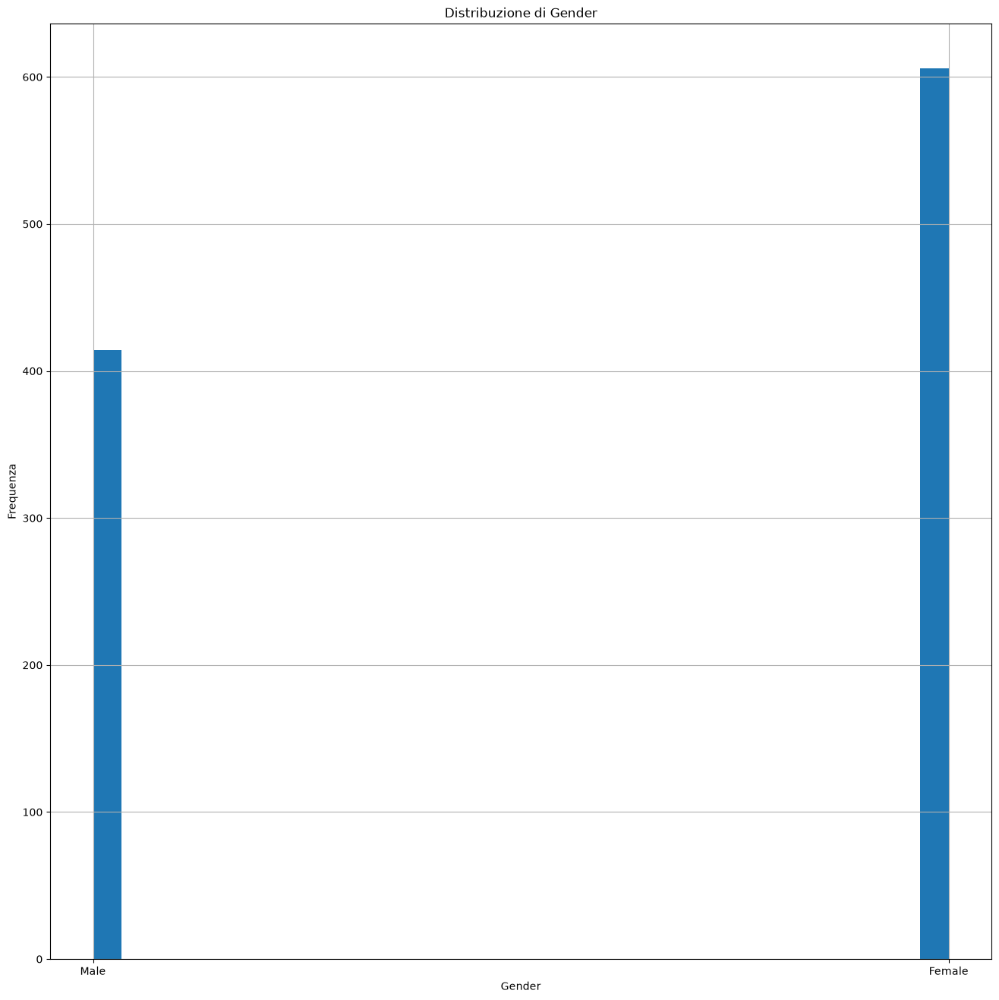

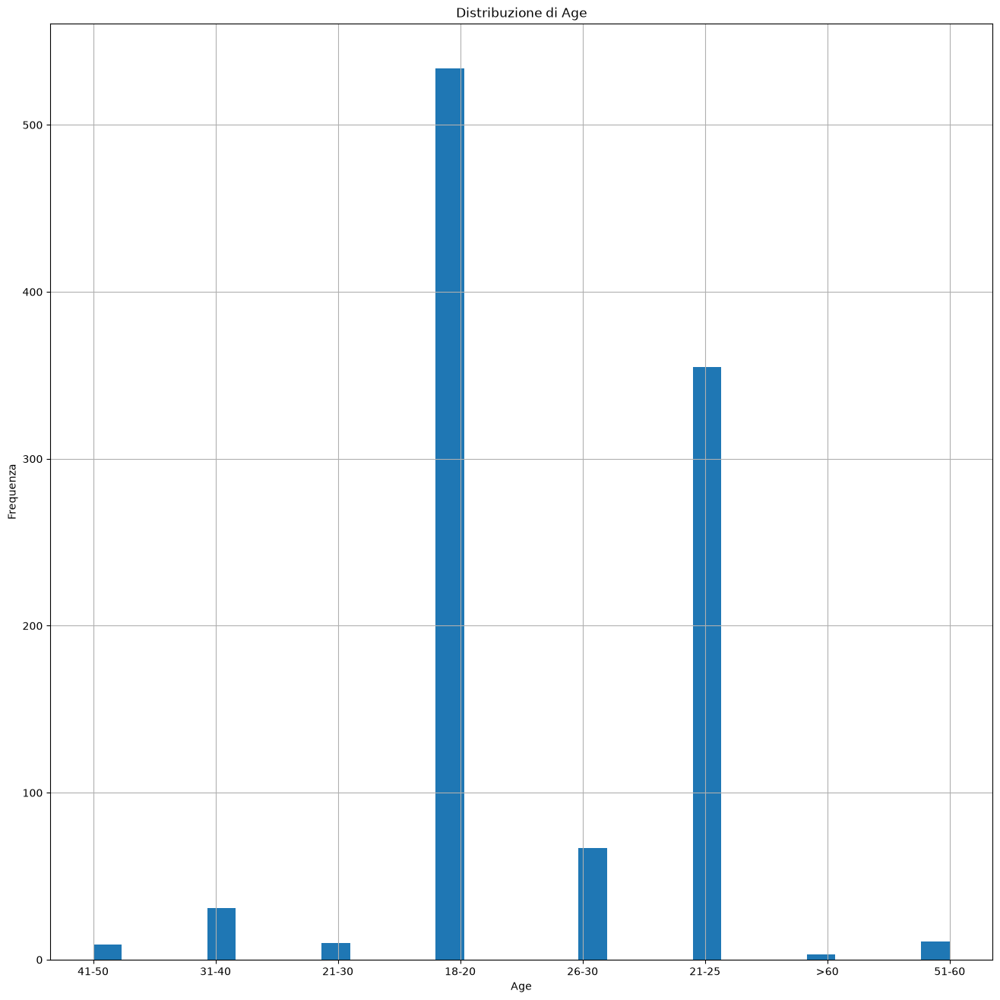

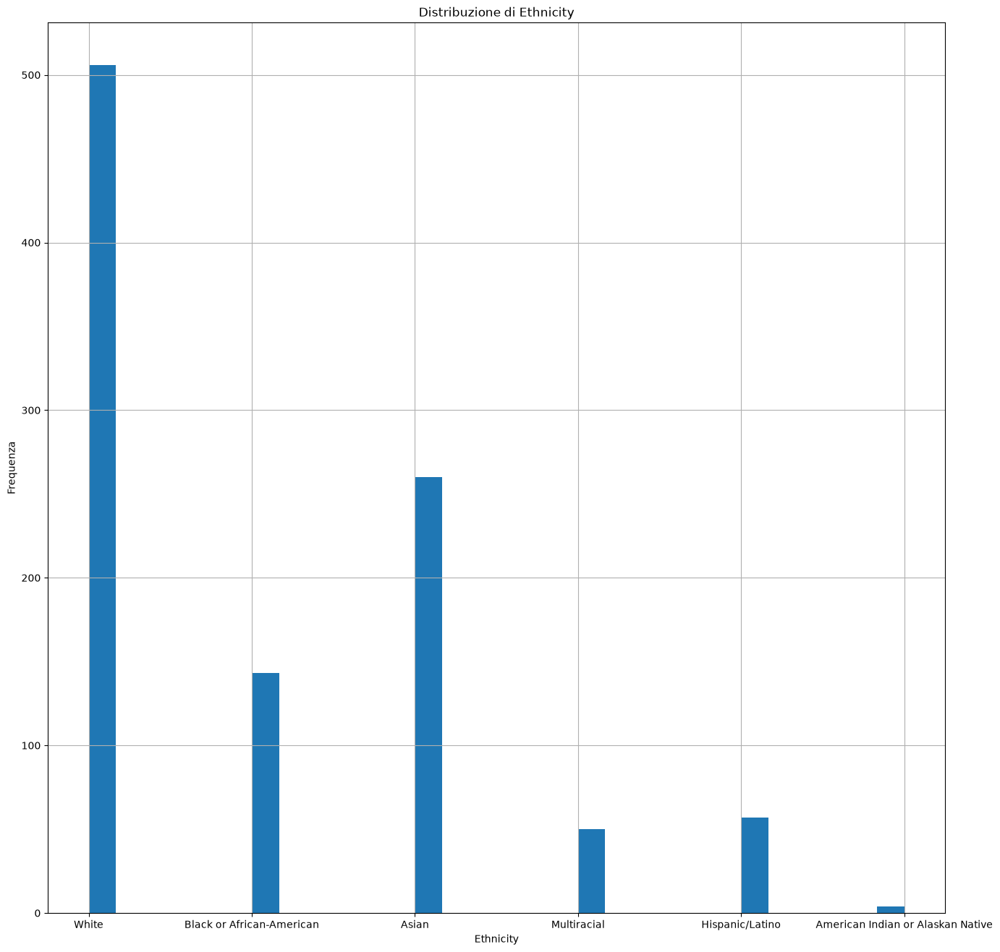

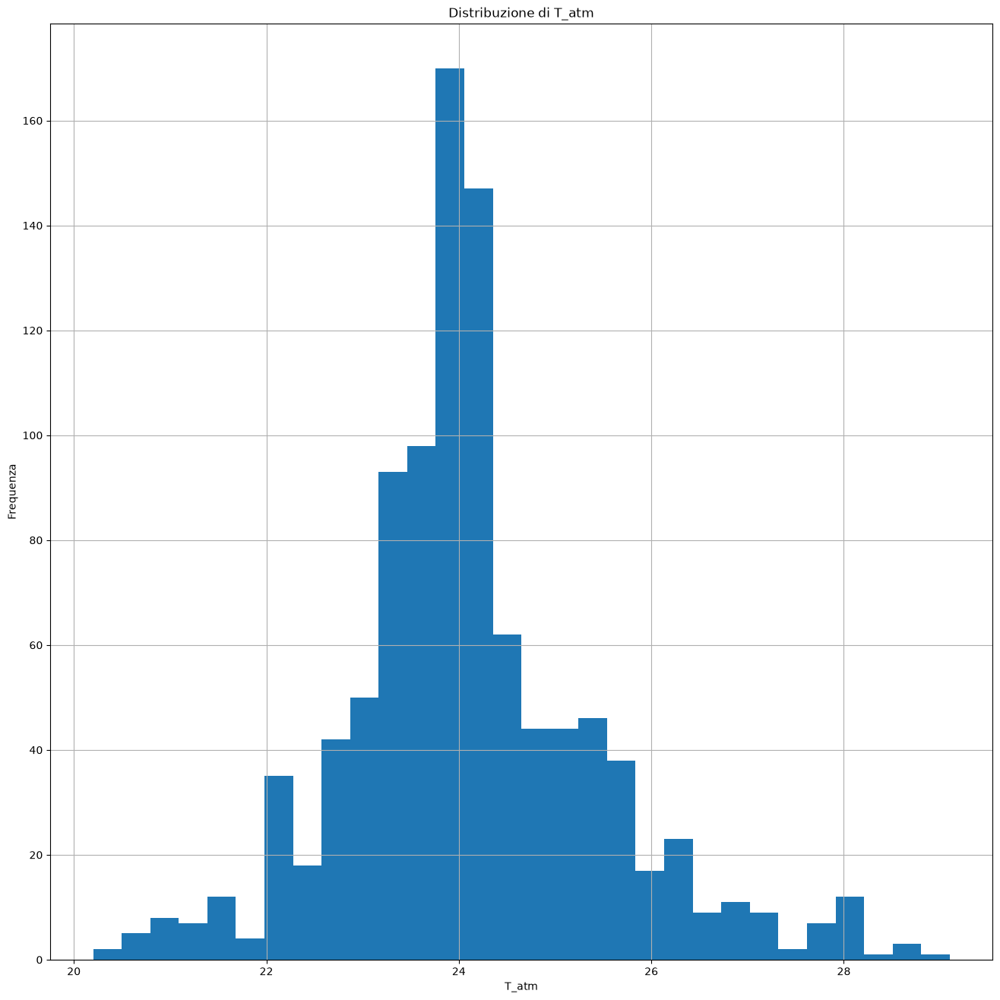

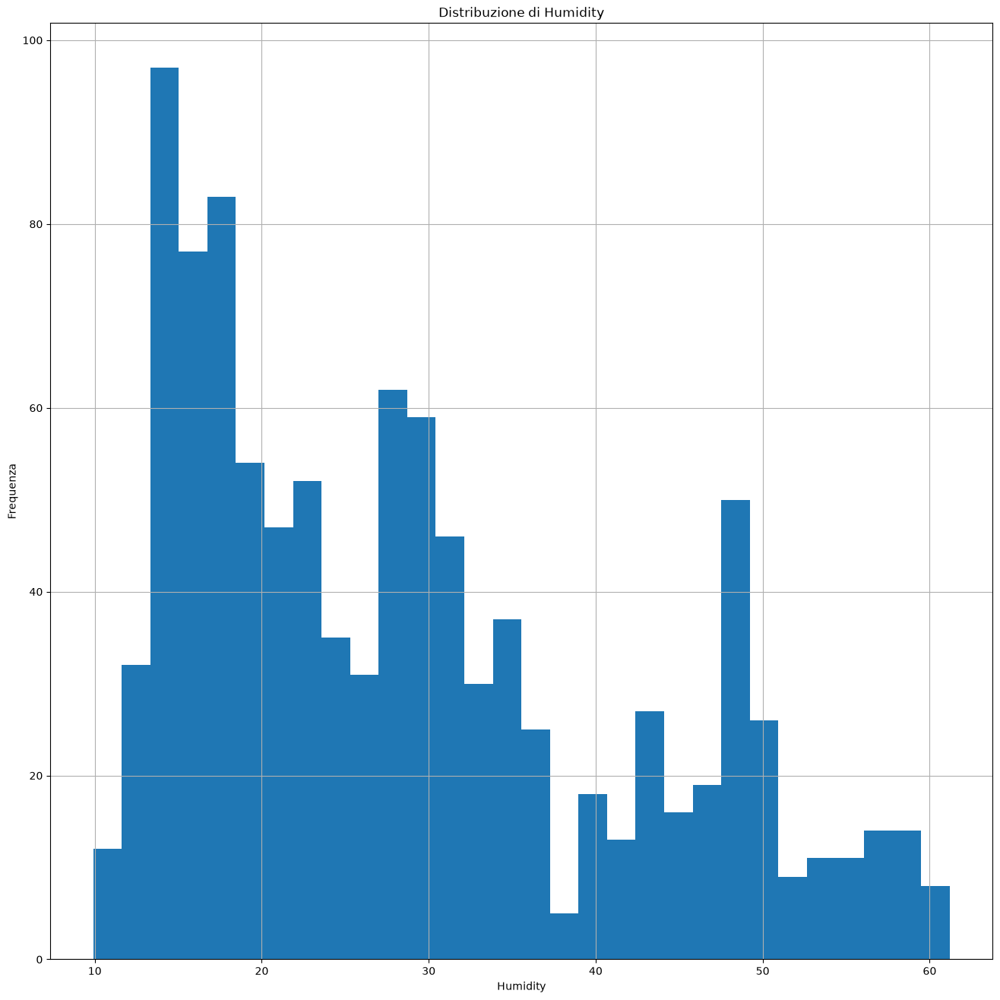

...

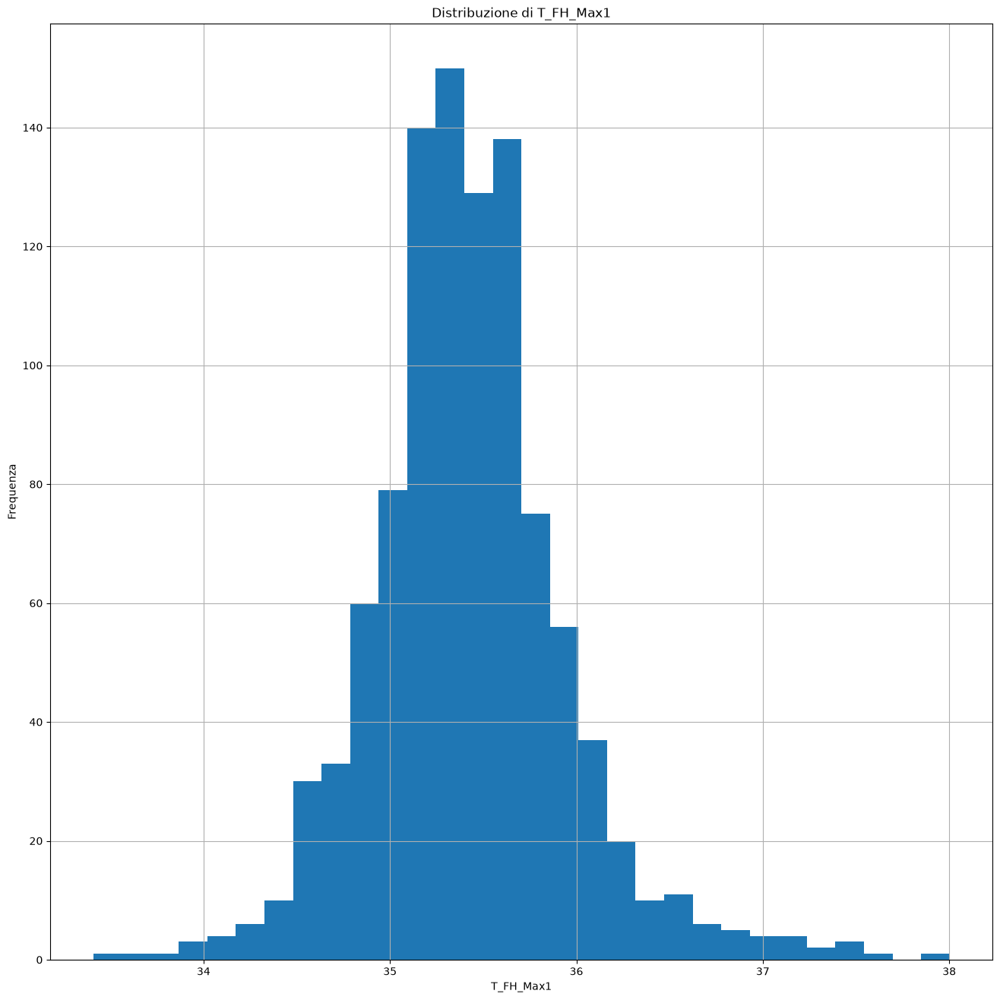

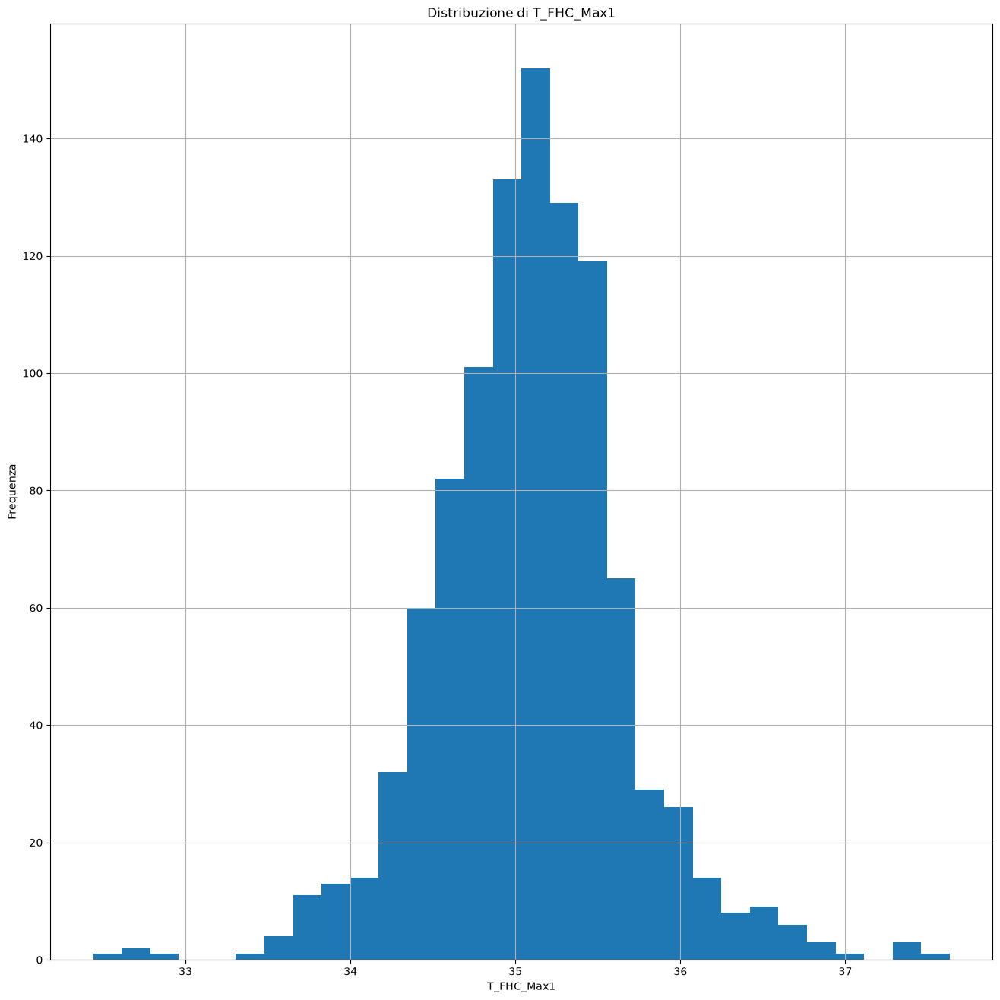

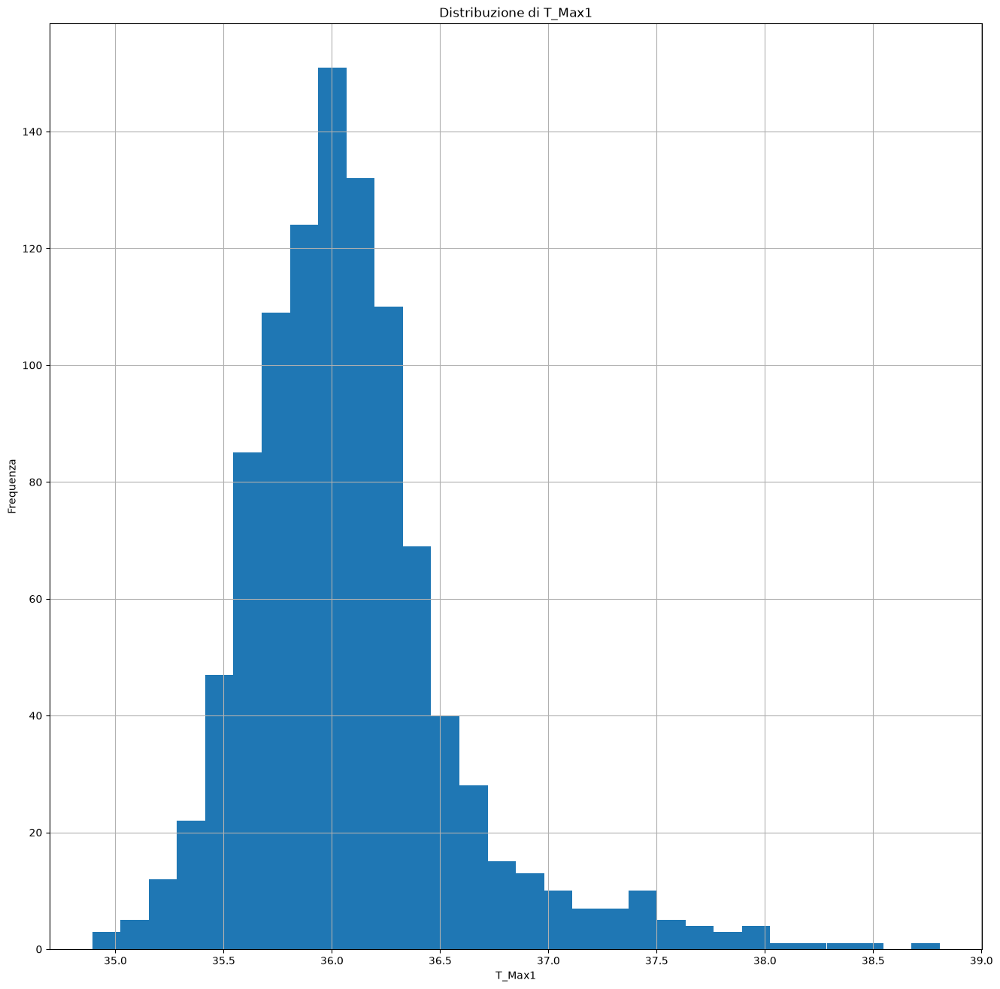

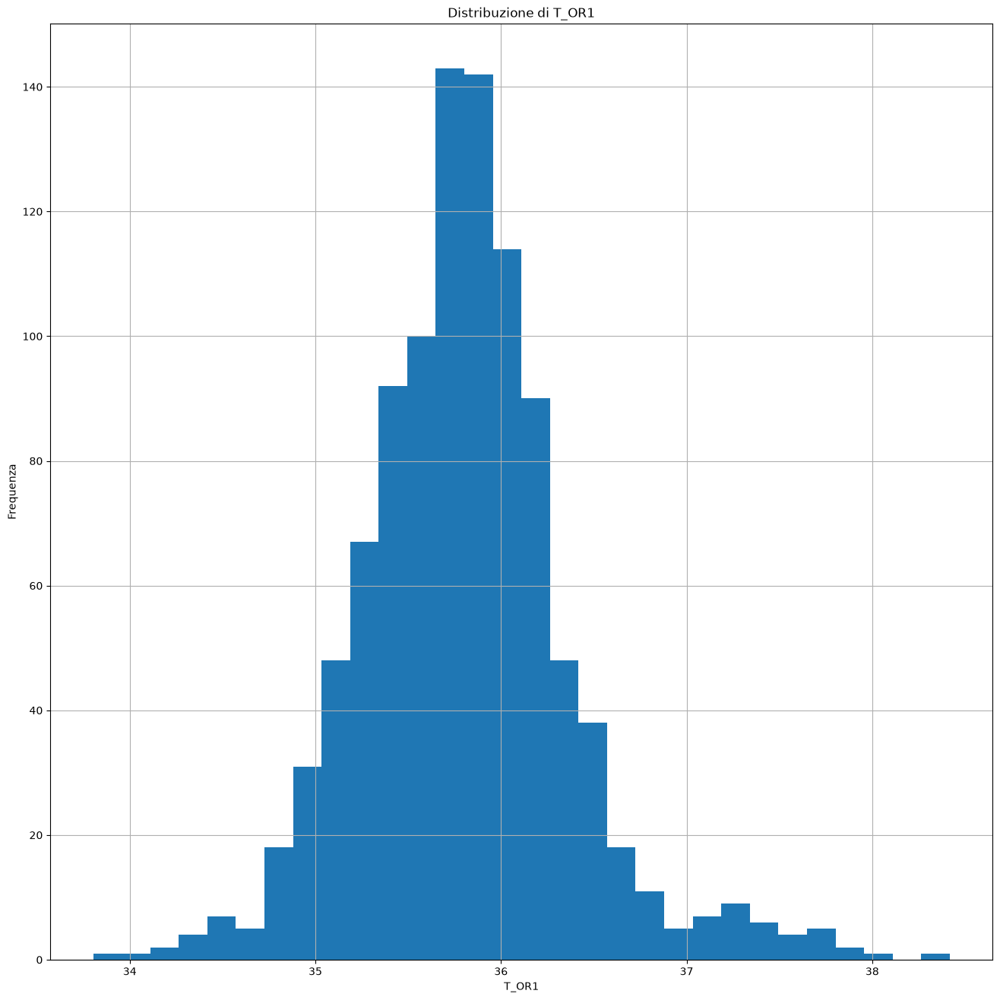

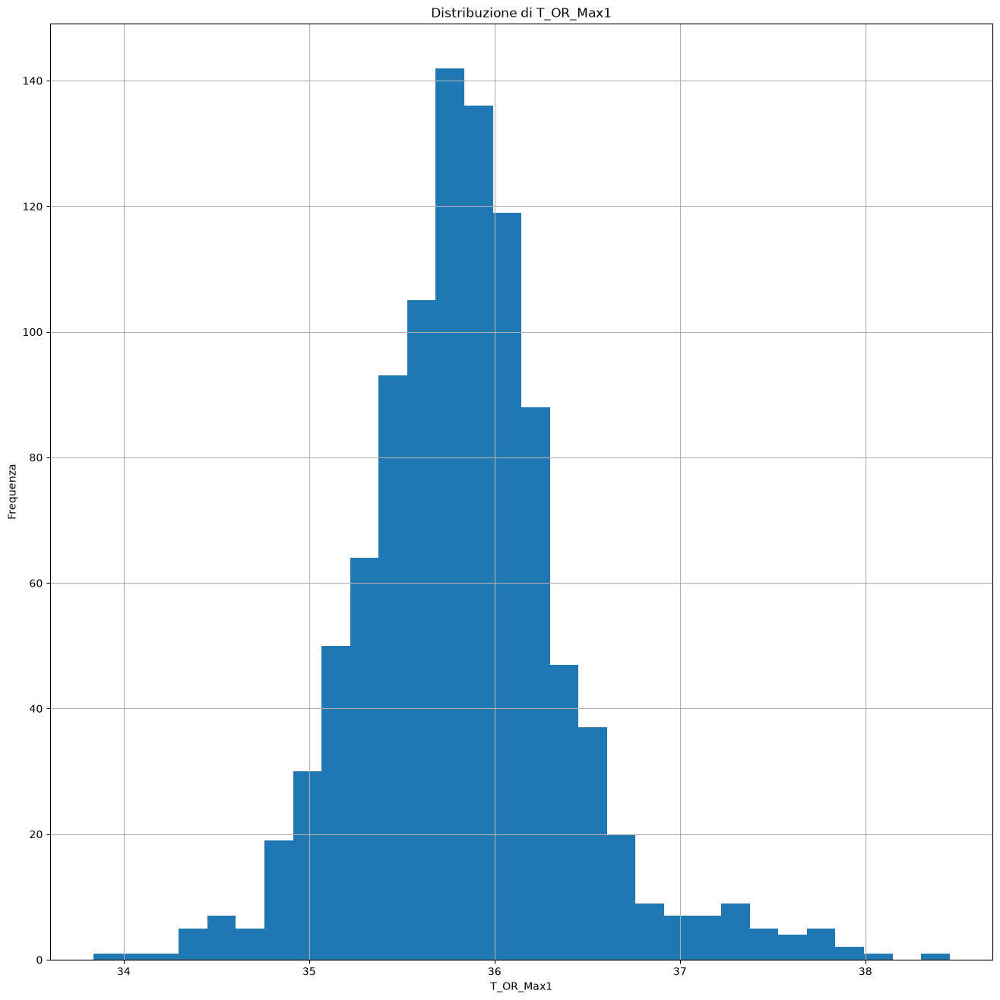

In [9]:
for col in X.columns:
    plt.figure(figsize=(16, 16))
    X[col].hist(bins=30)
    plt.title(f"Distribuzione di {col}")
    plt.xlabel(col); plt.ylabel("Frequenza")
    plt.show()


Osservo che la distanza delle misurazioni è unica e standard, procedo quindi ad eliminare la feature distance dal dataset perche non rilevante.
Noto che le popolazioni sono tutte gaussiane, quindi si procede alla standardizzazione delle feature continue. 

In [10]:
df.drop(columns="Distance", inplace=True)

In [11]:
corr = df.corr(numeric_only=True)
target_corr = corr["aveOralM"].sort_values(ascending=False)
target_corr

aveOralM                  1.000000
T_Max1                    0.849684
canthiMax1                0.784564
canthi4Max1               0.784227
T_RC_Max1                 0.769876
T_RC1                     0.769145
T_OR1                     0.767483
T_OR_Max1                 0.767039
T_RC_Wet1                 0.760433
T_LC_Max1                 0.750764
T_LC1                     0.750653
T_RC_Dry1                 0.749038
T_LC_Dry1                 0.743938
Max1R13_1                 0.742377
Max1L13_1                 0.735877
T_LC_Wet1                 0.720585
RCC1                      0.714478
LCC1                      0.696868
aveAllL13_1               0.648076
T_FH_Max1                 0.643324
aveAllR13_1               0.622122
T_FHC_Max1                0.597136
T_FHBC1                   0.555814
T_FHRC1                   0.516528
T_FHCC1                   0.515826
T_FHLC1                   0.465108
T_FHTC1                   0.457395
T_offset1                 0.139412
T_atm               

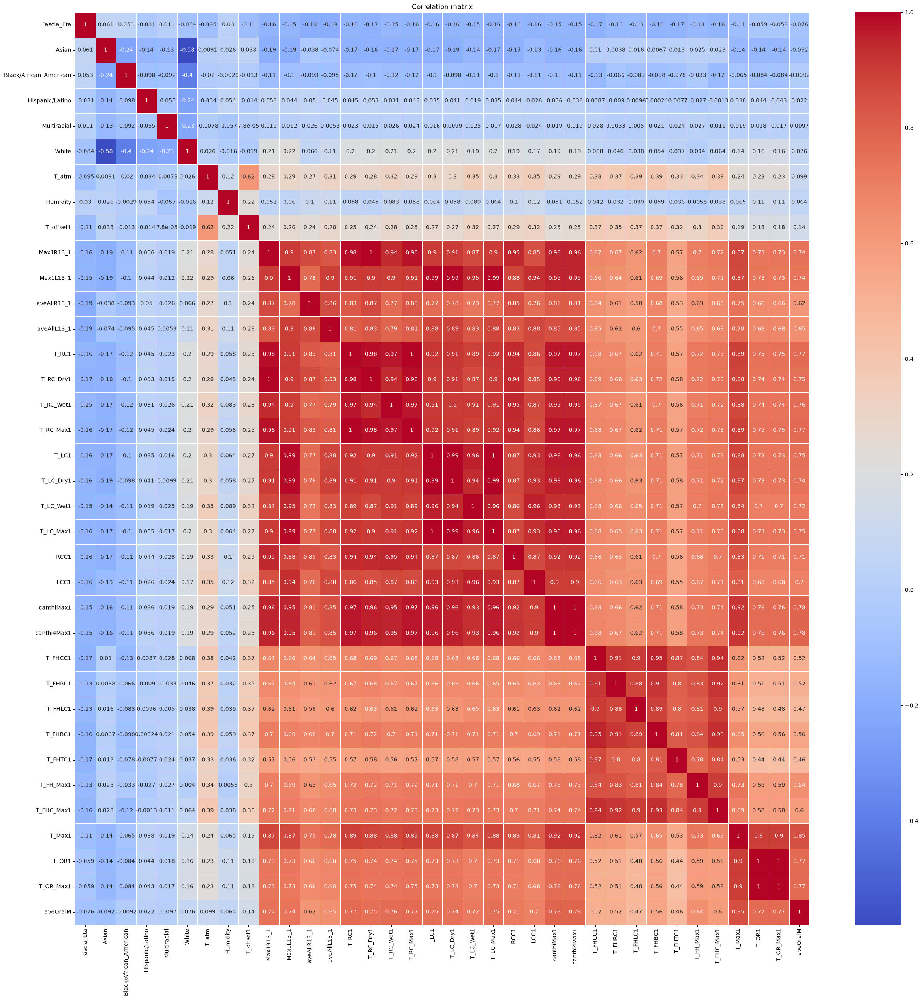

In [12]:
plt.figure(figsize=(30, 30))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation matrix')
plt.show()

Le feature relative alla misurazione della temperatura, come auspicabile, sono tra loro molto correlate (maggiormente se esse sono relative alle stesse zone facciali designate), inoltre, la Tmax registrata sulla faccia è forse la feature più indicativa, avendo una altissima correlazione con la Tobiettivo. 
Siccome la correlazione tra le feature puo rendere instabili i modelli, sopratutto di regressione, e, in generale, complicarne la computazione, mantengo le feature che registrano la media dei 4 pixel con temperatura piu elevata in quel distretto. La decisione è stata presa seguendo due morivazioni:
- per la legge secondo cui la media su una popolazione abbassa la deviazione standard con la radice del numero dei campioni che compongono la media (in questo caso std/2);
- le temperature massime sono quelle con maggiore correlazione con la label.

In [13]:
cols_to_drop = [
    "Max1R13_1", "Max1L13_1", "aveAllR13_1", "aveAllL13_1","T_RC_Dry1", "T_RC_Wet1", "T_RC_Max1",
    "T_LC_Dry1", "T_LC_Wet1","T_LC_Max1", 
    "RCC1", "LCC1","canthiMax1",
    "T_OR_Max1",
    ]
 
df.drop(columns=cols_to_drop, inplace=True)

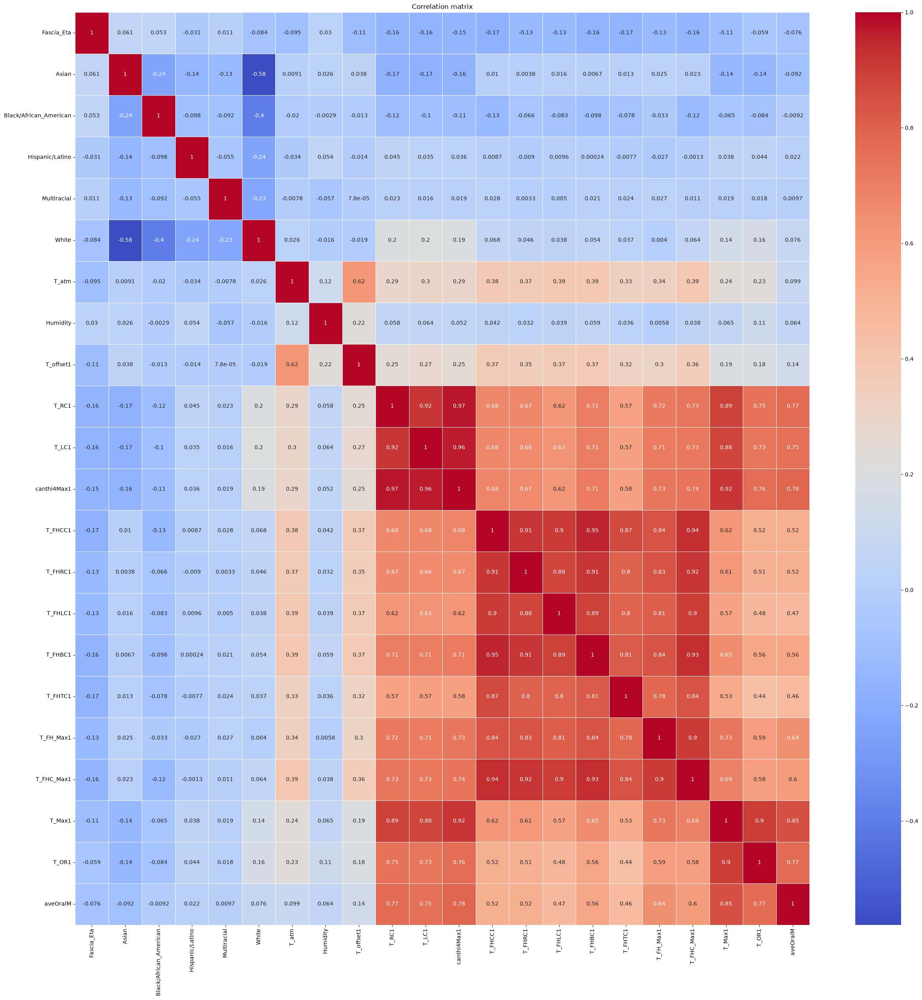

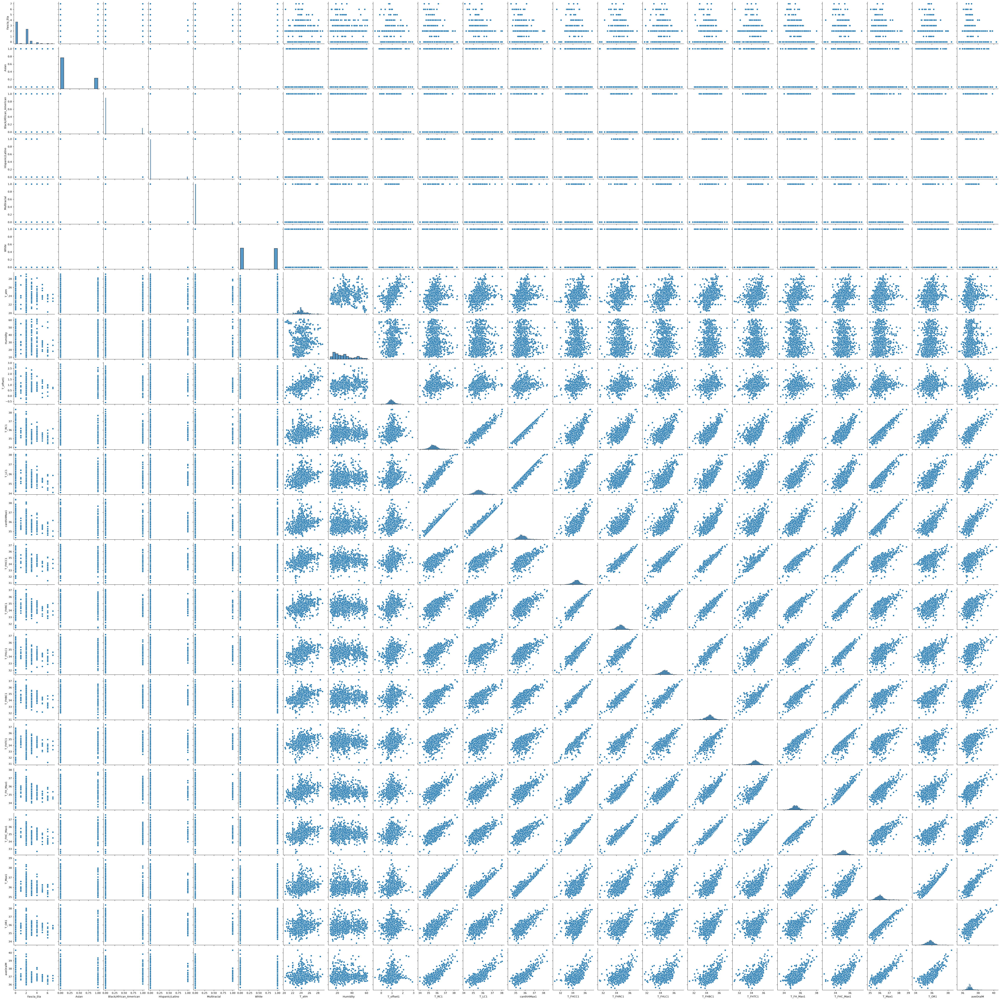

In [14]:
plt.figure(figsize=(30, 30))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation matrix')
plt.show()

sns.pairplot(df)


## 2. Train/Test split


In [15]:
X = df.drop(columns=['aveOralM'])
y = df['aveOralM']

cols_to_scale =[
    "T_atm", "Humidity", "T_offset1",
    "T_RC1", 
    "T_LC1",
    "canthi4Max1", 
    "T_FHCC1", "T_FHRC1", "T_FHLC1", "T_FHBC1", "T_FHTC1", 
    "T_FH_Max1", "T_FHC_Max1", 
    "T_Max1", 
    "T_OR1"
]

scaler = StandardScaler()
X_train_raw, X_test_raw, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42
)
X_train = X_train_raw.copy()
X_test = X_test_raw.copy()
X_train[cols_to_scale] = scaler.fit_transform(X_train_raw[cols_to_scale])
X_test[cols_to_scale] = scaler.transform(X_test_raw[cols_to_scale])

In [16]:
X_train.shape, X_test.shape,X.head()

((763, 21),
 (255, 21),
    Fascia_Eta  Asian  Black/African_American  Hispanic/Latino  Multiracial  \
 0         5.0    0.0                     0.0              0.0          0.0   
 1         4.0    0.0                     1.0              0.0          0.0   
 2         1.0    0.0                     0.0              0.0          0.0   
 3         1.0    0.0                     1.0              0.0          0.0   
 4         0.0    0.0                     0.0              0.0          0.0   
 
    White  T_atm  Humidity  T_offset1    T_RC1  ...  canthi4Max1  T_FHCC1  \
 0    1.0   24.0      28.0     0.7025  34.9850  ...      35.3375  33.5775   
 1    0.0   24.0      26.0     0.7800  34.7100  ...      34.7150  34.0325   
 2    1.0   24.0      26.0     0.8625  35.6850  ...      35.6825  34.9000   
 3    0.0   24.0      27.0     0.9300  35.2075  ...      35.5950  34.4400   
 4    1.0   24.0      27.0     0.8950  35.6025  ...      35.6475  35.0900   
 
    T_FHRC1  T_FHLC1  T_FHBC1  T_FHT

# 3. MODELLI E CONFRONTO

## K-NN

Per la scelta dei modelli il primo usato e messo a confronto è stato il K-NN i cui iperparametri sono stati valutati con GridSearch.

In [17]:
pipe_knn = Pipeline([("knn", KNeighborsRegressor())])
param_range = list(range(1, 31, 6))
param_grid_knn = {
    "knn__n_neighbors": param_range,
    "knn__weights": ["uniform", "distance"],
    "knn__metric": ["euclidean", "manhattan"]
}
gs_knn = GridSearchCV(
    pipe_knn, param_grid_knn, cv=5, n_jobs=-1,
    scoring="neg_mean_squared_error", refit=True,
    error_score='raise'

)
gs_knn.fit(X_train, y_train)

print("Migliori iperparametri:", gs_knn.best_params_)
print("CV RMSE (best):", (-gs_knn.best_score_)**0.5)

Migliori iperparametri: {'knn__metric': 'euclidean', 'knn__n_neighbors': 13, 'knn__weights': 'distance'}
CV RMSE (best): 0.28174139809515053


## Funzione per visualizzazione curva di validazione (generalization gap)

In [18]:
def curvaValidazione(pipe, X_train, y_train, param_name,param_range,scoring,TITLE, XLABEL,YLABEL,reverse,log_scale):
    train_scores, test_scores = validation_curve(
        pipe, X_train, y_train, 
        param_name=param_name, 
        param_range = param_range,
        scoring=scoring, 
        cv=5, n_jobs=-1
    )

    # Convertiamo gli score in RMSE (dato che la scoring è negativa)
    train_rmse = np.sqrt(-train_scores)
    test_rmse = np.sqrt(-test_scores)

    # Calcolo medie e deviazioni standard
    train_mean = np.mean(train_rmse, axis=1)
    train_std = np.std(train_rmse, axis=1)
    test_mean = np.mean(test_rmse, axis=1)
    test_std = np.std(test_rmse, axis=1)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(param_range, train_mean, label="Training score (RMSE)", color="blue", marker='o')
    plt.plot(param_range, test_mean, label="Cross-validation score (RMSE)", color="red", marker='o')

    plt.title(TITLE)
    plt.xlabel(XLABEL)
    plt.ylabel(YLABEL)
    plt.legend(loc="best")
    plt.grid(True)
    if reverse:
        plt.gca().invert_xaxis()
    if log_scale:    
        plt.xscale('log')
    plt.show()

VISUALIZZAZIONE DELLA CURVA DI VALIDAZIONE PER ACCERTARE LA SCELTA DEL PARAMETRO

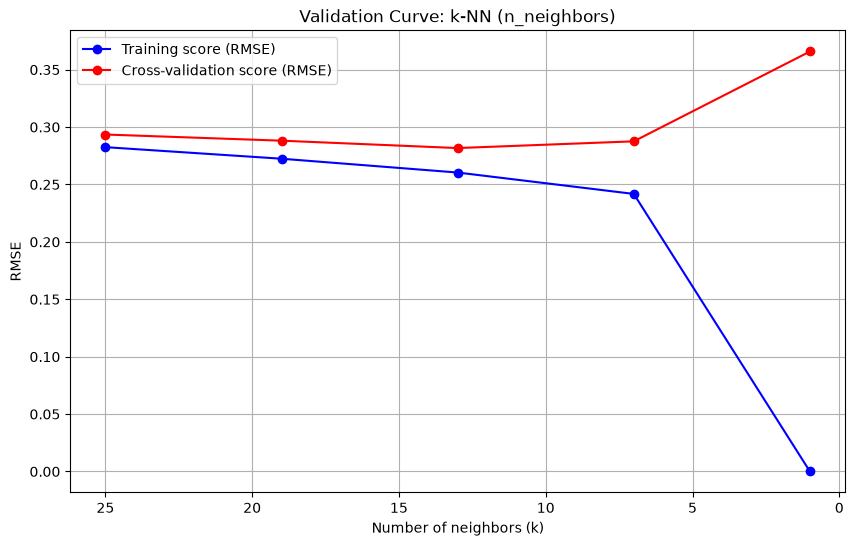

In [19]:
curvaValidazione(pipe_knn, X_train, y_train, "knn__n_neighbors",param_range,"neg_mean_squared_error","Validation Curve: k-NN (n_neighbors)","Number of neighbors (k)","RMSE",1,0)

In [20]:
# Test
y_pred_knn = gs_knn.predict(X_test)
rmse_knn = mean_squared_error(y_test, y_pred_knn)**0.5
mae_knn  = mean_absolute_error(y_test, y_pred_knn)
r2_knn   = r2_score(y_test, y_pred_knn)
max_error_knn = np.max(np.abs(y_test - y_pred_knn))

print(f"Test RMSE (k-NN): {rmse_knn:.4f}")
print(f"Test MAE  (k-NN): {mae_knn:.4f}")
print(f"Test R^2  (k-NN): {r2_knn:.4f}")
print(f"MAX ERROR: {max_error_knn:.4f}")

Test RMSE (k-NN): 0.2568
Test MAE  (k-NN): 0.1944
Test R^2  (k-NN): 0.6835
MAX ERROR: 0.9034


## Decision Tree

In [21]:
dt = DecisionTreeRegressor(random_state=42)
param_grid_dt = {
    "criterion": ["absolute_error"],
    "max_depth": [None, 1,2,3,4,5,6,7,8,9,10],
    "min_samples_leaf": [1, 2, 5]
}
gs_dt = GridSearchCV(
    dt, param_grid_dt, cv=5, n_jobs=-1,
    scoring="neg_mean_squared_error", refit=True
)
gs_dt.fit(X_train, y_train)

print("Migliori iperparametri:", gs_dt.best_params_)
print("CV RMSE (best):", (-gs_dt.best_score_)**0.5)

Migliori iperparametri: {'criterion': 'absolute_error', 'max_depth': 3, 'min_samples_leaf': 1}
CV RMSE (best): 0.2826883917375904


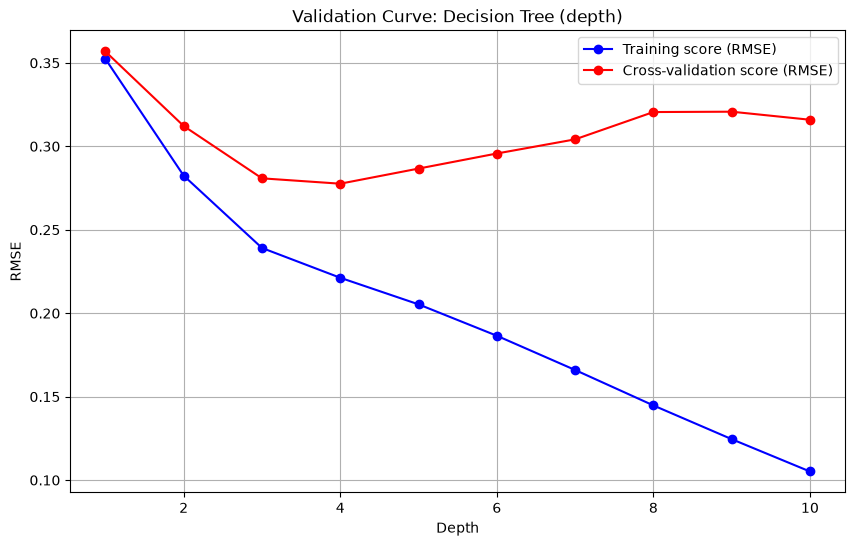

In [22]:
curvaValidazione(dt, X_train, y_train, "max_depth",[None, 1,2,3,4,5,6,7,8,9,10],"neg_mean_squared_error","Validation Curve: Decision Tree (depth)","Depth","RMSE",0,0)

In [23]:

# Test
y_pred_dt = gs_dt.predict(X_test)
rmse_dt = mean_squared_error(y_test, y_pred_dt)**0.5
mae_dt  = mean_absolute_error(y_test, y_pred_dt)
r2_dt   = r2_score(y_test, y_pred_dt)
max_error_dt = np.max(np.abs(y_test - y_pred_dt))

print(f"Test RMSE (DT): {rmse_dt:.4f}")
print(f"Test MAE  (DT): {mae_dt:.4f}")
print(f"Test R^2  (DT): {r2_dt:.4f}")
print(f"MAX ERROR: {max_error_dt:.4f}")


Test RMSE (DT): 0.2636
Test MAE  (DT): 0.2031
Test R^2  (DT): 0.6664
MAX ERROR: 0.9000


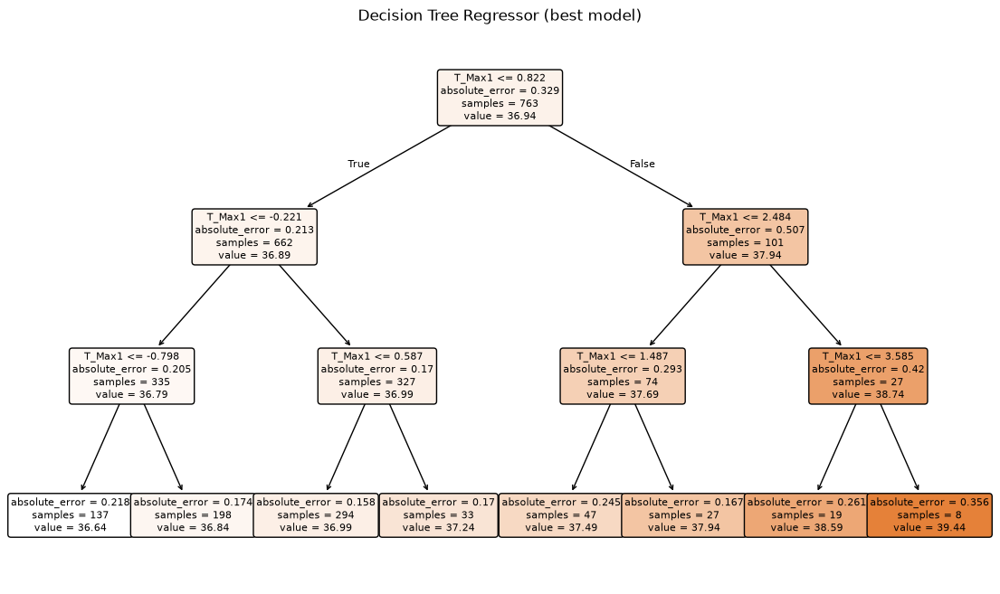

In [24]:
# Tree diagram
best_dt = gs_dt.best_estimator_
plt.figure(figsize=(14, 8))
plot_tree(best_dt, feature_names=X.columns, filled=True, rounded=True)
plt.title("Decision Tree Regressor (best model)")
plt.show()


## REGRESSIONE LINEARE

In [25]:
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
y_pred_lr = model_lr.predict(X_test)

rmse_lr = mean_squared_error(y_test, y_pred_lr)**0.5
mae_lr  = mean_absolute_error(y_test, y_pred_lr)
r2_lr   = r2_score(y_test, y_pred_lr)
max_error_lr = np.max(np.abs(y_test - y_pred_lr))

# 5. Valutazione
print(f"Coefficienti: {model_lr.coef_}")
print(f"Intercetta: {model_lr.intercept_}")
print(f"____________________________________________________________")
print(f"Test RMSE (DT): {rmse_lr:.4f}")
print(f"Test MAE  (DT): {mae_lr:.4f}")
print(f"Test R^2  (DT): {r2_lr:.4f}")
print(f"MAX ERROR: {max_error_lr:.4f}")

Coefficienti: [ 0.00651458  0.13409121  0.16370983  0.05075897  0.09766783  0.07908885
 -0.08935515  0.0095865   0.03517784  0.06287011  0.03550821 -0.01813636
 -0.10641368 -0.00211901 -0.0810782   0.03808265  0.01989915  0.05743254
  0.09657849  0.33869186  0.03394834]
Intercetta: 36.91273926143147
____________________________________________________________
Test RMSE (DT): 0.2532
Test MAE  (DT): 0.1971
Test R^2  (DT): 0.6923
MAX ERROR: 0.8250


## PLOT ACCURACY PREDICTION VISUALIZATION

In [26]:
def _fasce_errore(abs_err):
    """Assegna ogni errore assoluto a una fascia; restituisce indici, etichette e colori."""
    soglie = [0.2, 0.5, 1.0]                                  # soglie in gradi C
    etichette = ["|err| <= 0.2 C", "0.2 < |err| <= 0.5 C",
                 "0.5 < |err| <= 1.0 C", "|err| > 1.0 C"]
    colori = ["#2ca02c", "#ffcc00", "#ff7f0e", "#d62728"]     # verde -> giallo -> arancio -> rosso
    idx = np.digitize(abs_err, soglie, right=True)
    return idx, etichette, colori


def plot_risultati(y_true, y_pred, TITLE):
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    abs_err = np.abs(y_true - y_pred)

    idx, etichette, colori = _fasce_errore(abs_err)

    plt.figure(figsize=(8, 6))

    # uno strato di scatter per ogni fascia di errore, con colore diverso
    for k in range(len(etichette)):
        m = idx == k
        if m.any():
            plt.scatter(y_true[m], y_pred[m], color=colori[k], alpha=0.6,
                        edgecolor='none', s=35,
                        label=f"{etichette[k]}  (n={int(m.sum())})")

    # Linea ideale (dove y_true == y_pred)
    lims = [
        np.min([y_true.min(), y_pred.min()]),
        np.max([y_true.max(), y_pred.max()]),
    ]
    plt.plot(lims, lims, color='black', linestyle='--', linewidth=1.5,
             label='Linea ideale (y_true = y_pred)')

    plt.xlabel('Valori Reali (y_true)')
    plt.ylabel('Valori Predetti (y_pred)')
    plt.title(f'Confronto Valori Reali vs Predetti {TITLE}\n(colore = fascia di errore assoluto)')
    plt.legend(loc='upper left', fontsize=8)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


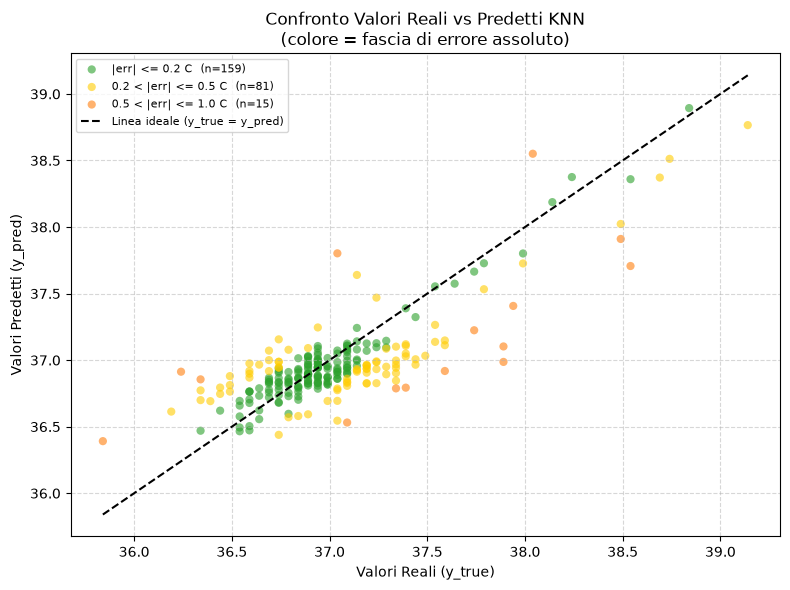

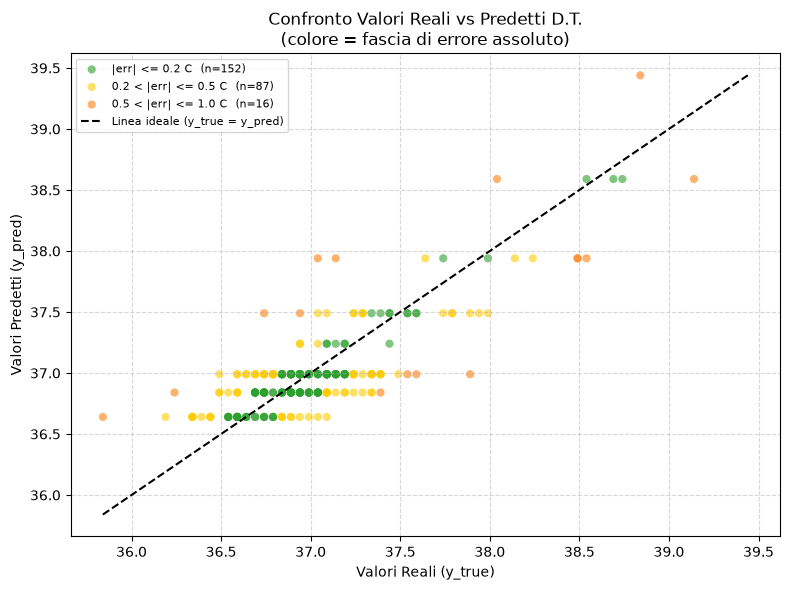

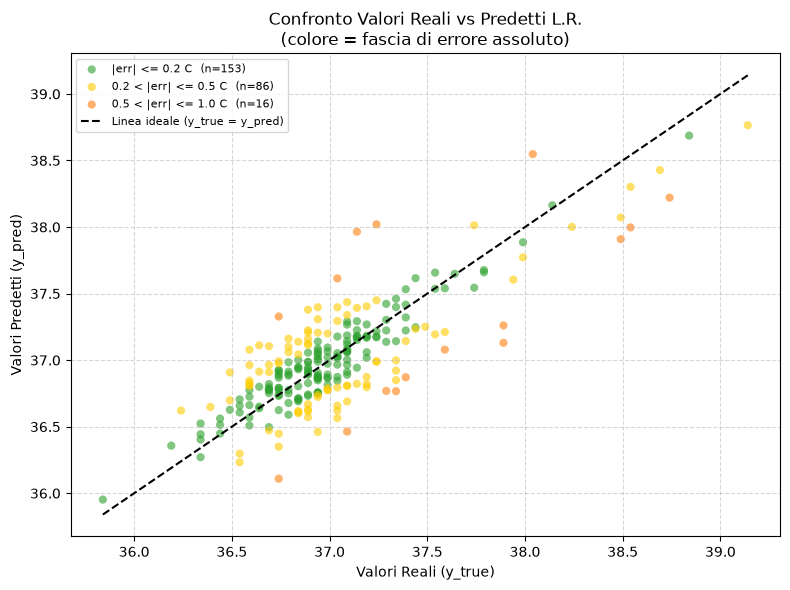

In [27]:
plot_risultati(y_test,y_pred_knn, "KNN")
plot_risultati(y_test,y_pred_dt, "D.T.")
plot_risultati(y_test,y_pred_lr, "L.R.")

Tra i tre modelli, nonostante le performance sulle metriche siano numericamente simili, i plot ci mostrano che il modello piu promettente è quello della regressione lineare:
- K-NN soffre i pochi dati nelle code della popolazione in cui non riesce a interpolare correttamente i dati
- Decision tree individua degli "scaglioni" di temperatura e risulterebbe sicuramente piu utile in una classificazione piuttosto che in regressione in cui, per performare con minore errore possibile, non riesce a fare dei bin granulari soddisfacenti sui dati
E' sembrato quindi logico proseguire lo studio andando a lavorare sul modello di regressione e sulle sue feature.

In [28]:
print(f"________________________RIDGE________________________________\n")
ridgeReg = RidgeCV(alphas = [0.0001, 0.001,0.01, 0.1, 1, 10,10000,100000000]).fit(X_train, y_train)
y_pred_R = ridgeReg.predict(X_test)

rmse_R = mean_squared_error(y_test, y_pred_R)**0.5
mae_R  = mean_absolute_error(y_test,y_pred_R)
r2_R   = r2_score(y_test, y_pred_R)
max_error_R = np.max(np.abs(y_test - y_pred_R))
print(f"Alpha scelto da RidgeCV: {ridgeReg.alpha_}")
print(f"____________________________________________________________")
print(f"Coefficienti: {ridgeReg.coef_}")
print(f"Intercetta: {ridgeReg.intercept_}")
print(f"____________________________________________________________")
print(f"Test RMSE (DT): {rmse_R:.4f}")
print(f"Test MAE  (DT): {mae_R:.4f}")
print(f"Test R^2  (DT): {r2_R:.4f}")
print(f"MAX ERROR: {max_error_R:.4f}")

________________________RIDGE________________________________

Alpha scelto da RidgeCV: 10.0
____________________________________________________________
Coefficienti: [ 0.00647051  0.03089099  0.05845484 -0.04119627 -0.00588544 -0.02478235
 -0.08739885  0.01041181  0.03085655  0.05150693  0.02656017  0.03550158
 -0.07995899 -0.00153807 -0.0748372   0.02105624  0.01422942  0.07125716
  0.07477384  0.27790569  0.06157659]
Intercetta: 37.01574004516269
____________________________________________________________
Test RMSE (DT): 0.2504
Test MAE  (DT): 0.1953
Test R^2  (DT): 0.6991
MAX ERROR: 0.8056


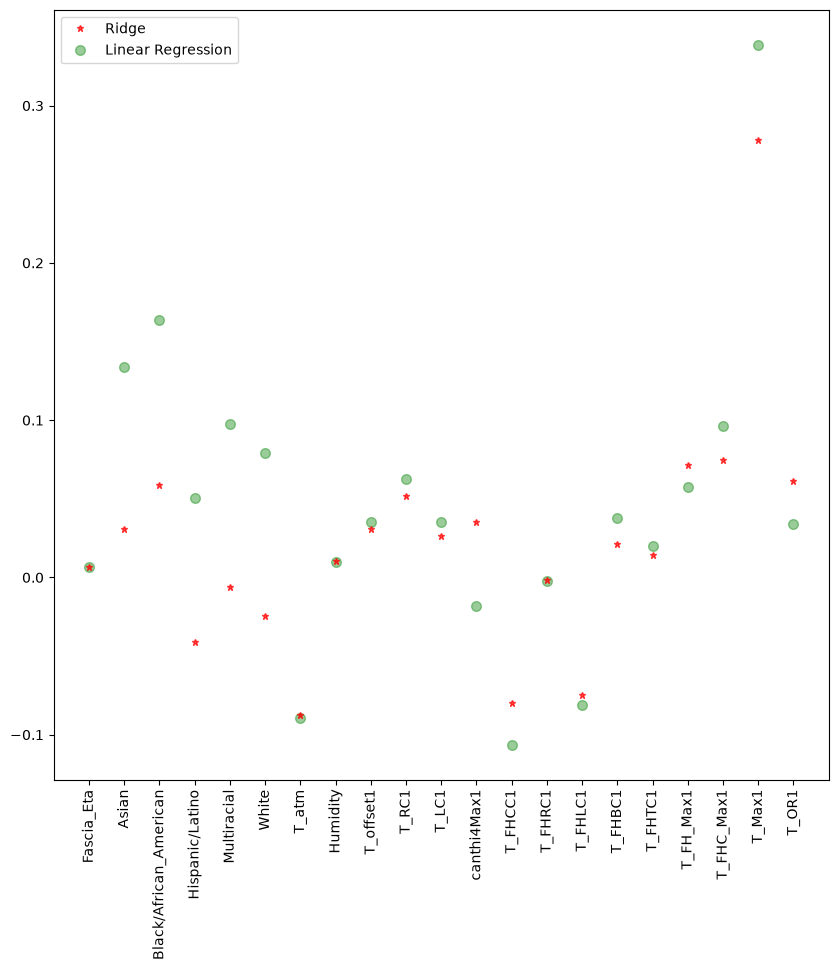

In [29]:
plt.figure(figsize = (10, 10))
plt.plot(X.columns[:],ridgeReg.coef_,alpha=0.7,linestyle='none',marker='*',markersize=5,color='red',label=r'Ridge',zorder=7)
plt.plot(X.columns[:],model_lr.coef_,alpha=0.4,linestyle='none',marker='o',markersize=7,color='green',label='Linear Regression')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

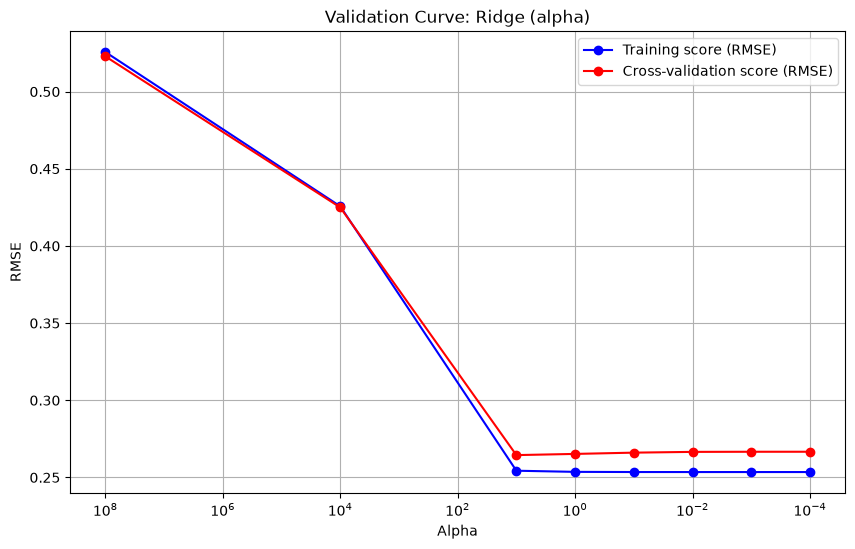

In [30]:
ridge = Ridge()

curvaValidazione(ridge, X_train, y_train, "alpha", [0.0001, 0.001,0.01, 0.1, 1, 10,10000,100000000],"neg_mean_squared_error","Validation Curve: Ridge (alpha)","Alpha","RMSE",1,1)

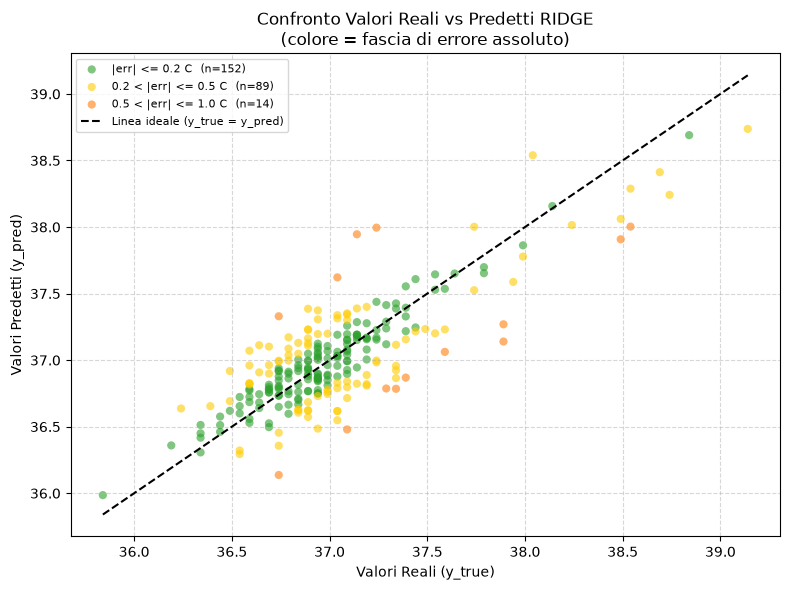

In [31]:
plot_risultati(y_test,y_pred_R, "RIDGE")

In [32]:
print("_____________Lasso Model_____________\n")
lassoReg = LassoCV(alphas = [0.0001, 0.001,0.01, 0.1, 1, 10,10000,100000000], random_state=0).fit(X_train, y_train)
lassoReg.fit(X_train,y_train)

y_pred_L=lassoReg.predict(X_test)

rmse_L = mean_squared_error(y_test, y_pred_L)**0.5
mae_L  = mean_absolute_error(y_test,y_pred_L)
r2_L   = r2_score(y_test, y_pred_L)
max_error_L = np.max(np.abs(y_test - y_pred_L))

print(f"Alpha scelto da LassoCV: {lassoReg.alpha_}")
print(f"____________________________________________________________")
print(f"Coefficienti: {lassoReg.coef_}")
print(f"Intercetta: {lassoReg.intercept_}")
print(f"____________________________________________________________")
print(f"Test RMSE (DT): {rmse_L:.4f}")
print(f"Test MAE  (DT): {mae_L:.4f}")
print(f"Test R^2  (DT): {r2_L:.4f}")
print(f"MAX ERROR: {max_error_L:.4f}")

_____________Lasso Model_____________

Alpha scelto da LassoCV: 0.001
____________________________________________________________
Coefficienti: [ 0.00607803  0.03672286  0.06373801 -0.02344067  0.         -0.01110067
 -0.08571713  0.00978124  0.03225737  0.05201663  0.02748468  0.
 -0.07512489  0.         -0.0717503   0.01752473  0.01161768  0.06080326
  0.07917676  0.33740709  0.03461155]
Intercetta: 37.0059563388742
____________________________________________________________
Test RMSE (DT): 0.2509
Test MAE  (DT): 0.1952
Test R^2  (DT): 0.6978
MAX ERROR: 0.8017


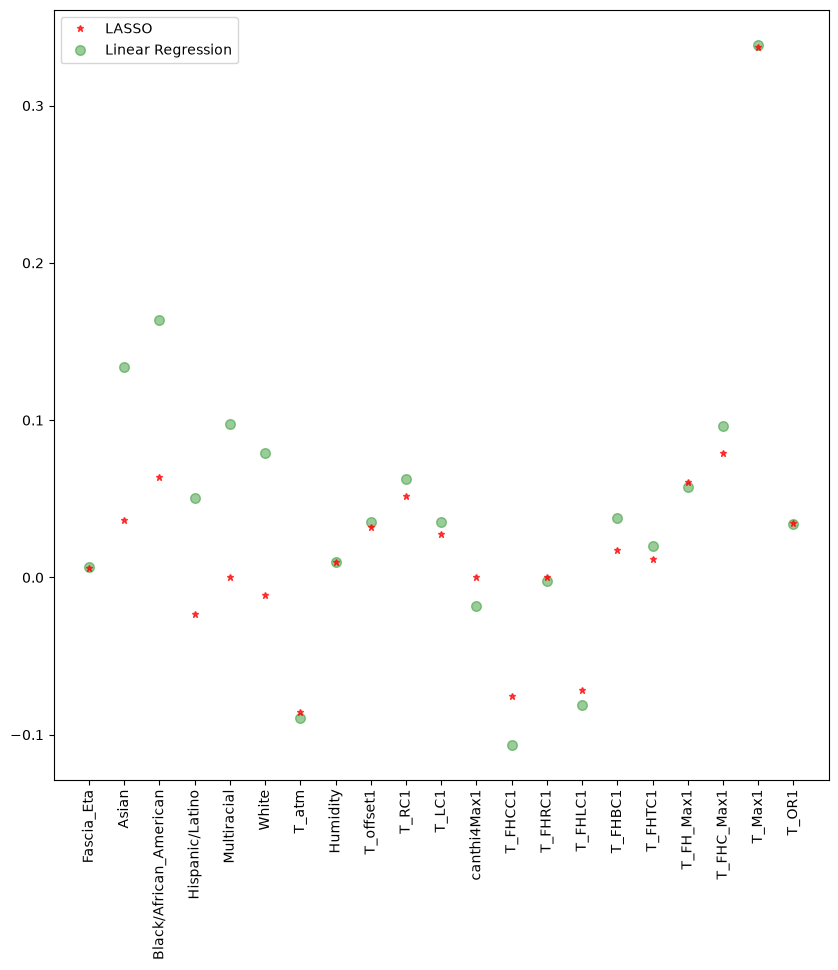

In [33]:
plt.figure(figsize = (10, 10))
plt.plot(X.columns[:],lassoReg.coef_,alpha=0.7,linestyle='none',marker='*',markersize=5,color='red',label=r'LASSO',zorder=7)
plt.plot(X.columns[:],model_lr.coef_,alpha=0.4,linestyle='none',marker='o',markersize=7,color='green',label='Linear Regression')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

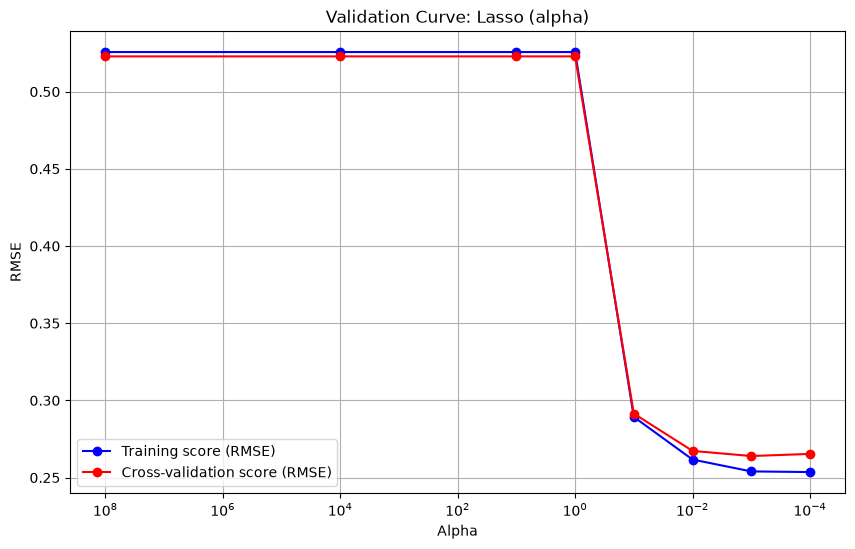

In [34]:
lasso = Lasso()

curvaValidazione(lasso, X_train, y_train, "alpha", [0.0001, 0.001,0.01, 0.1, 1, 10,10000,100000000],"neg_mean_squared_error","Validation Curve: Lasso (alpha)","Alpha","RMSE",1,1)

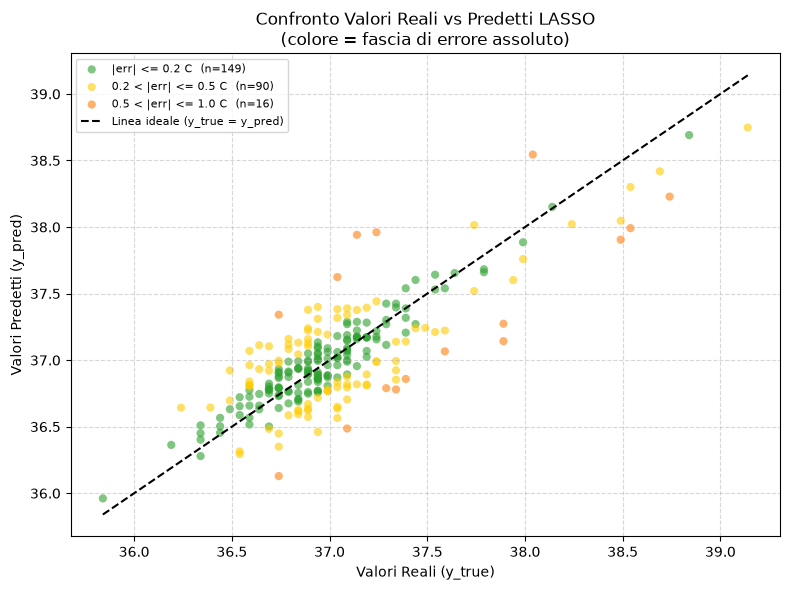

In [35]:
plot_risultati(y_test,y_pred_L, "LASSO")

I modelli si comportano meglio dopo ridge e lasso, cosa interessante è che, seppur molti coefficienti tendono a 0 con un ordine di grandezza in piu rispetto gli altri, nessuno viene azzerato e tutte le feature rimangono nei rispettivi modelli. Questo, evidentemente, è sinonimo del fatto che, nonostante la grande correlazione tra i dati, tutte le feature contribuiscono a livello informativo nella risposta.

## 4. PCA

A testimonianza di ciò si è prodotto anche un modello di regressione con PCA. Questo ha, tuttavia, solo scopo scientifico in quanto fa perdere al modello di spiegabilità essenziale in ambito medico.

In [36]:
pipeline = Pipeline([
    ('pca', PCA(n_components=0.95)),  # Mantiene il 95% della varianza
    ('regressore', LinearRegression())
])

# 2. Addestramento (fit) della pipeline
pipeline.fit(X_train, y_train)

# 3. Predizione
y_pred_PCA = pipeline.predict(X_test)

# 4. Metriche
rmse_PCA = mean_squared_error(y_test, y_pred_PCA)**0.5
mae_PCA  = mean_absolute_error(y_test, y_pred_PCA)
r2_PCA   = r2_score(y_test, y_pred_PCA)
max_error_PCA = np.max(np.abs(y_test - y_pred_PCA))
# 5. Output
# Nota: i coefficienti ora si riferiscono alle componenti principali, non alle feature originali
print("_____________Linear Regression con PCA_____________\n")
print(f"____________________________________________________________")
print(f"Numero di componenti principali usate: {pipeline.named_steps['pca'].n_components_}")
print(f"Coefficienti (sulle componenti PCA): {pipeline.named_steps['regressore'].coef_}")
print(f"____________________________________________________________")
print(f"Test RMSE (PCA): {rmse_PCA:.4f}")
print(f"Test MAE  (PCA): {mae_PCA:.4f}")
print(f"Test R^2  (PCA): {r2_PCA:.4f}")
print(f"MAX ERROR: {max_error_PCA:.4f}")

_____________Linear Regression con PCA_____________

____________________________________________________________
Numero di componenti principali usate: 10
Coefficienti (sulle componenti PCA): [ 0.12005643  0.11321427 -0.13950072  0.03869677  0.01569525  0.1229823
  0.10310465  0.00956395  0.05931569  0.05521268]
____________________________________________________________
Test RMSE (PCA): 0.2469
Test MAE  (PCA): 0.1936
Test R^2  (PCA): 0.7073
MAX ERROR: 0.7467


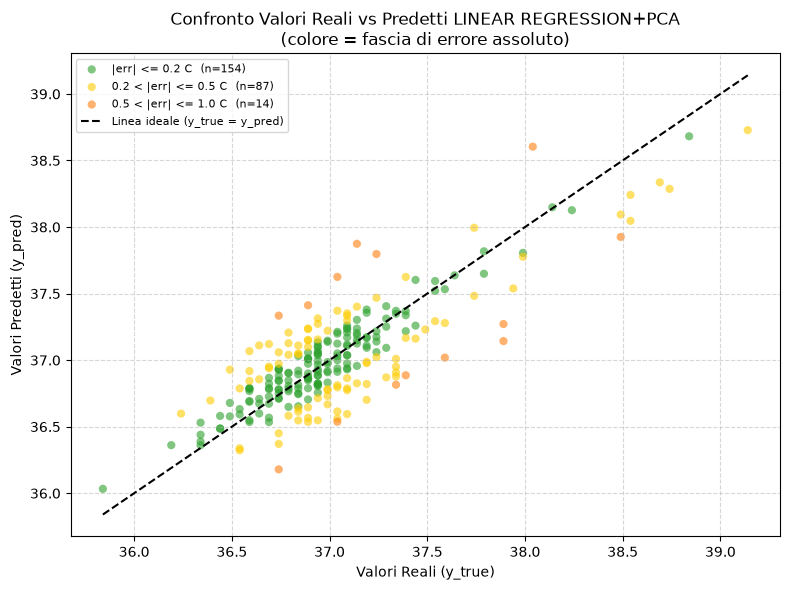

In [37]:
plot_risultati(y_test,y_pred_PCA, "LINEAR REGRESSION+PCA")

Come volevasi dimostrare, il modello si comporta praticamente nella stessa maniera dei regressori su dataset senza PCA.

## 5. NN

Con le NN si vuole vedere se si riesce ad intercettare ancora meglio eventuali non linearità del modello

In [38]:
class NNDropout(nn.Module):
    def __init__(self, in_features, dropout_rate=0.3):
        super().__init__()
        self.fc1 = nn.Linear(in_features, 50)
        self.bn1 = nn.BatchNorm1d(50)
        self.drop1 = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(50, 1)

    def forward(self, x):
        x = torch.relu(self.bn1(self.fc1(x)))
        x = self.drop1(x)
        x = self.fc2(x)
        return x

# in_features ricavato dai dati (non piu hardcoded a 21)
model = NNDropout(in_features=X_train.shape[1]).to(device)
print(model)

NNDropout(
  (fc1): Linear(in_features=21, out_features=50, bias=True)
  (bn1): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
  (drop1): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=50, out_features=1, bias=True)
)


In [39]:
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4,
    weight_decay=0
)

In [40]:
criterion = nn.HuberLoss()
num_epochs = 5000
train_loss_history = []
validation_loss_history = []

In [41]:
print("X_train:", X_train.shape)
print("y_train:", y_train.shape)

print("X_test:", X_test.shape)
print("y_test:", y_test.shape)

X_train = torch.tensor(np.asarray(X_train), dtype=torch.float32)
y_train = torch.tensor(np.asarray(y_train), dtype=torch.float32)
dataset_train = TensorDataset(X_train, y_train)

X_test = torch.tensor(np.asarray(X_test), dtype=torch.float32)
y_test = torch.tensor(np.asarray(y_test), dtype=torch.float32)
dataset_test = TensorDataset(X_test, y_test)

X_train: (763, 21)
y_train: (763,)
X_test: (255, 21)
y_test: (255,)


In [42]:
train_size = int(0.8 * len(dataset_train))
val_size = len(dataset_train) - train_size

train_dataset, val_dataset = random_split(
    dataset_train,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(dataset_test, batch_size=256, shuffle=False)

In [43]:
best_test_loss = float('inf')

for epoch in range(num_epochs):
    model.train()
    running_train_loss = 0.0

    for datas, labels in train_loader:
        datas = datas.to(device)
        labels = labels.to(device)
        labels = labels.view(-1, 1)

        optimizer.zero_grad()
        outputs = model(datas)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

    avg_train_loss = running_train_loss / len(train_loader)
    train_loss_history.append(avg_train_loss)

    model.eval()
    running_validation_loss = 0.0

    with torch.no_grad():  # niente gradienti in valutazione
        for datas, labels in val_loader:
            datas = datas.to(device)
            labels = labels.to(device)
            labels = labels.view(-1, 1)
            outputs = model(datas)
            loss = criterion(outputs, labels)   # loss, ma su dati indipendenti
            running_validation_loss += loss.item()

    avg_validation_loss = running_validation_loss / len(val_loader)
    validation_loss_history.append(avg_validation_loss)

    print(f"Epoch {epoch+1}/{num_epochs} - "
          f"train_loss: {avg_train_loss:.4f} - validation_loss: {avg_validation_loss:.4f}")
    
    if avg_validation_loss < best_test_loss:
        best_test_loss = avg_validation_loss
        torch.save(model.state_dict(), 'best_model.pth')

Epoch 1/5000 - train_loss: 36.1834 - validation_loss: 36.1899
Epoch 2/5000 - train_loss: 36.0884 - validation_loss: 36.1062
Epoch 3/5000 - train_loss: 36.0535 - validation_loss: 36.0206
Epoch 4/5000 - train_loss: 35.9952 - validation_loss: 36.0166
Epoch 5/5000 - train_loss: 35.9772 - validation_loss: 35.9721
Epoch 6/5000 - train_loss: 35.9349 - validation_loss: 35.9408
Epoch 7/5000 - train_loss: 35.8685 - validation_loss: 35.8394
Epoch 8/5000 - train_loss: 35.8524 - validation_loss: 35.8506
Epoch 9/5000 - train_loss: 35.7849 - validation_loss: 35.7754
Epoch 10/5000 - train_loss: 35.7507 - validation_loss: 35.7467
Epoch 11/5000 - train_loss: 35.6807 - validation_loss: 35.7259
Epoch 12/5000 - train_loss: 35.6280 - validation_loss: 35.6752
Epoch 13/5000 - train_loss: 35.5650 - validation_loss: 35.6416
Epoch 14/5000 - train_loss: 35.5319 - validation_loss: 35.5721
Epoch 15/5000 - train_loss: 35.4731 - validation_loss: 35.5106
Epoch 16/5000 - train_loss: 35.4551 - validation_loss: 35.4703
E

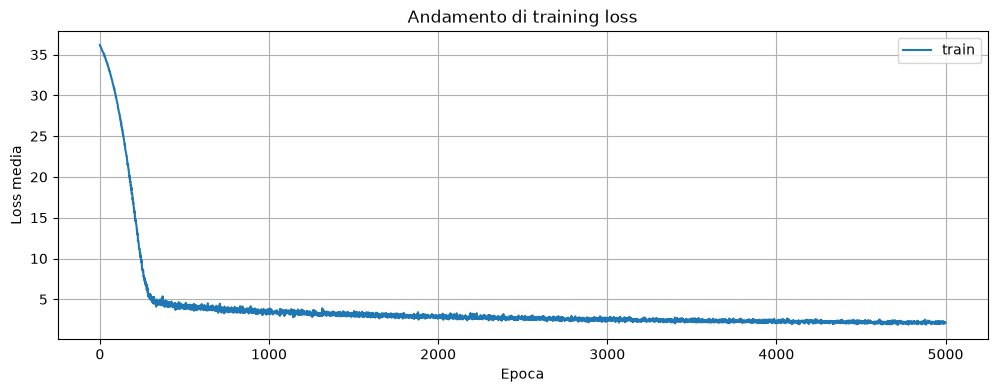

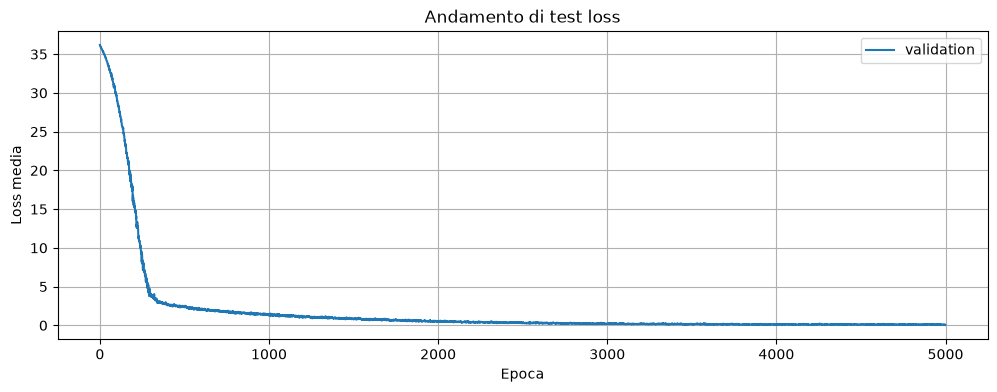

In [44]:
plt.figure(figsize=(12, 4))
plt.plot(train_loss_history, label="train")
plt.xlabel("Epoca")
plt.ylabel("Loss media")
plt.title("Andamento di training loss")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 4))
plt.plot(validation_loss_history, label="validation")
plt.xlabel("Epoca")
plt.ylabel("Loss media")
plt.title("Andamento di test loss")
plt.legend()
plt.grid(True)
plt.show()

In [45]:
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

y_preds = []
y_trues = []

with torch.no_grad():
    for datas, labels in test_loader:
        datas = datas.to(device)
        outputs = model(datas)
        y_preds.append(outputs.cpu().numpy())
        y_trues.append(labels.cpu().numpy())

y_pred_NN = np.vstack(y_preds).flatten()
y_test = np.concatenate(y_trues).flatten()

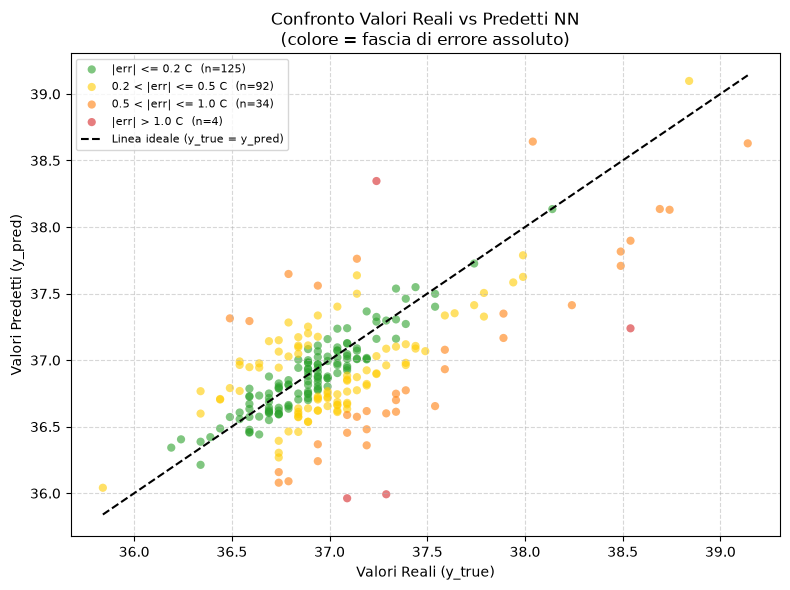

In [46]:
plot_risultati(y_test,y_pred_NN, "NN")

In [47]:
print(y)
risultato = y.index[y ==38.84]
print(risultato)
print(X.iloc[261])
print(X.iloc[688])
print(X.iloc[800])

0       36.59
1       37.19
2       37.34
3       37.09
4       37.04
        ...  
1015    36.99
1016    37.19
1017    37.59
1018    37.29
1019    37.19
Name: aveOralM, Length: 1018, dtype: float64
Index([261, 688, 800], dtype='int64')
Fascia_Eta                 0.0000
Asian                      0.0000
Black/African_American     0.0000
Hispanic/Latino            0.0000
Multiracial                0.0000
White                      1.0000
T_atm                     25.5000
Humidity                  25.5000
T_offset1                  1.0900
T_RC1                     37.5575
T_LC1                     37.8875
canthi4Max1               37.8875
T_FHCC1                   36.5875
T_FHRC1                   36.1825
T_FHLC1                   35.9475
T_FHBC1                   36.4975
T_FHTC1                   36.4100
T_FH_Max1                 37.2900
T_FHC_Max1                36.7100
T_Max1                    37.9425
T_OR1                     37.3975
Name: 261, dtype: float64
Fascia_Eta             

In [48]:
rmse_NN = mean_squared_error(y_test, y_pred_NN)**0.5
mae_NN  = mean_absolute_error(y_test, y_pred_NN)
r2_NN   = r2_score(y_test, y_pred_NN)
max_error_NN = np.max(np.abs(y_test - y_pred_NN))

print("_____________ NN _____________\n")
print(f"Test RMSE (NN): {rmse_NN:.4f}")
print(f"Test MAE  (NN): {mae_NN:.4f}")
print(f"Test R^2  (NN): {r2_NN:.4f}")
print(f"MAX ERROR  (NN): {max_error_NN:.4f}")


_____________ NN _____________

Test RMSE (NN): 0.3573
Test MAE  (NN): 0.2693
Test R^2  (NN): 0.3873
MAX ERROR  (NN): 1.3009


# CONCLUSIONI

In [49]:

# Confronto aggregato di tutti i modelli
results_comparison = pd.DataFrame({
    'Modello': ['K-NN', 'Decision Tree', 'Linear Reg', 'Ridge', 'Lasso', 'PCA+Linear', 'NN'],
    'RMSE': [rmse_knn, rmse_dt, rmse_lr, rmse_R, rmse_L, rmse_PCA,rmse_NN],
    'MAE': [mae_knn, mae_dt, mae_lr, mae_R, mae_L, mae_PCA,mae_NN],
    'R^2': [r2_knn, r2_dt, r2_lr, r2_R, r2_L, r2_PCA,r2_NN],
    'MAX ERROR': [max_error_knn, max_error_dt, max_error_lr, max_error_R, max_error_L, max_error_PCA, max_error_NN]
})

print("="*80)
print("CONFRONTO PERFORMANCE MODELLI")
print("="*80)
print(results_comparison.to_string(index=False))
print("="*80)


CONFRONTO PERFORMANCE MODELLI
      Modello     RMSE      MAE      R^2  MAX ERROR
         K-NN 0.256810 0.194403 0.683460   0.903356
Decision Tree 0.263647 0.203137 0.666382   0.900000
   Linear Reg 0.253201 0.197124 0.692294   0.824964
        Ridge 0.250370 0.195318 0.699138   0.805616
        Lasso 0.250924 0.195241 0.697805   0.801749
   PCA+Linear 0.246947 0.193594 0.707307   0.746682
           NN 0.357295 0.269266 0.387286   1.300926


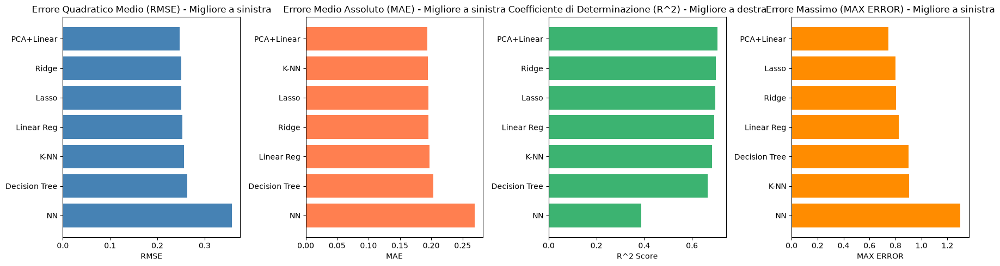


____________ RANKING PER METRICA ____________

Migliore RMSE: PCA+Linear (0.2469)
Migliore MAE: PCA+Linear (0.1936)
Migliore R^2: PCA+Linear (0.7073)
Migliore MAX ERROR: PCA+Linear (0.7467)


In [50]:

# Visualizzazione comparativa delle performance
fig, axes = plt.subplots(1, 4, figsize=(18, 5))

# RMSE comparison
results_rmse = results_comparison.sort_values('RMSE')
axes[0].barh(results_rmse['Modello'], results_rmse['RMSE'], color='steelblue')
axes[0].set_xlabel('RMSE')
axes[0].set_title('Errore Quadratico Medio (RMSE) - Migliore a sinistra')
axes[0].invert_yaxis()

# MAE comparison
results_mae = results_comparison.sort_values('MAE')
axes[1].barh(results_mae['Modello'], results_mae['MAE'], color='coral')
axes[1].set_xlabel('MAE')
axes[1].set_title('Errore Medio Assoluto (MAE) - Migliore a sinistra')
axes[1].invert_yaxis()

# R^2 comparison
results_r2 = results_comparison.sort_values('R^2', ascending=False)
axes[2].barh(results_r2['Modello'], results_r2['R^2'], color='mediumseagreen')
axes[2].set_xlabel('R^2 Score')
axes[2].set_title('Coefficiente di Determinazione (R^2) - Migliore a destra')
axes[2].invert_yaxis()
#MAX ERROR comparison
results_max_error = results_comparison.sort_values('MAX ERROR')
axes[3].barh(results_max_error['Modello'], results_max_error['MAX ERROR'], color='darkorange')
axes[3].set_xlabel('MAX ERROR')
axes[3].set_title('Errore Massimo (MAX ERROR) - Migliore a sinistra')
axes[3].invert_yaxis()

plt.tight_layout()
plt.show()

print("\n____________ RANKING PER METRICA ____________")
print(f"\nMigliore RMSE: {results_rmse['Modello'].iloc[0]} ({results_rmse['RMSE'].iloc[0]:.4f})")
print(f"Migliore MAE: {results_mae['Modello'].iloc[0]} ({results_mae['MAE'].iloc[0]:.4f})")
print(f"Migliore R^2: {results_r2['Modello'].iloc[0]} ({results_r2['R^2'].iloc[0]:.4f})")
print(f"Migliore MAX ERROR: {results_max_error['Modello'].iloc[0]} ({results_max_error['MAX ERROR'].iloc[0]:.4f})")


## 6. Analisi della fairness delle classi

Per ogni modello si calcola l'errore assoluto |y_true - y_pred| sul test set e lo si aggrega
per **fascia d'eta** e per **etnia**, riportando errore **minimo, medio e massimo** di ogni
categoria in un grafico a barre. Le informazioni demografiche vengono recuperate dalle colonne
categoriche originali (`X_cat_original`) tramite l'indice del test set (`X_test_raw.index`),
cosi da evitare l'ambiguita della categoria di riferimento eliminata nella one-hot encoding.

In [58]:
def analisi_errore_demografico(y_true, y_pred, index_test, X_cat, titolo, humidity_step=10):
    """Errore assoluto per fascia d'eta, etnia, genere e umidita.
    Rettangolo min-max, linea della media, baffi della deviazione standard
    (media +/- 1 std) e numerosita n annotata su ogni gruppo.
    L'umidita e continua: viene binnata in fasce di ampiezza fissa (humidity_step)."""
    from matplotlib.lines import Line2D
    from matplotlib.patches import Patch

    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    if len(y_true) != len(index_test):
        raise ValueError("Lunghezza predizioni diversa dal numero di righe di test.")

    def _age_key(s):
        nums = re.findall(r'\d+', str(s))
        return int(nums[0]) if nums else 10**9

    demo = X_cat.loc[index_test, ['Age', 'Ethnicity', 'Gender', 'Humidity']].copy()
    demo['abs_err'] = np.abs(y_true - y_pred)

    # Humidity e continua -> fasce di AMPIEZZA FISSA (humidity_step punti percentuali)
    lo = int(np.floor(demo['Humidity'].min() / humidity_step) * humidity_step)
    hi = int(np.ceil(demo['Humidity'].max() / humidity_step) * humidity_step)
    edges = list(range(lo, hi + humidity_step, humidity_step))
    etich = [f"{edges[i]}-{edges[i+1]}" for i in range(len(edges) - 1)]
    demo['Humidity_bin'] = pd.cut(demo['Humidity'], bins=edges, labels=etich,
                                  include_lowest=True, right=True)

    # codice colore invariato: min=verde, media=blu, max=rosso
    C_MIN, C_MEAN, C_MAX = '#2ca02c', '#1f77b4', '#d62728'
    w = 0.6  # larghezza del rettangolo

    # (colonna di raggruppamento, titolo del pannello, modo di ordinamento)
    pannelli = [
        ('Age',          "fascia d'eta", 'age'),
        ('Ethnicity',    'etnia',        'mean'),
        ('Gender',       'genere',       'mean'),
        ('Humidity_bin', 'umidita (%)',  'order'),
    ]

    fig, axes = plt.subplots(1, len(pannelli), figsize=(26, 6))

    for ax, (col, titolo_cat, ordinamento) in zip(axes, pannelli):
        # aggrego: min, media, max, deviazione standard e numerosita (count)
        g = demo.groupby(col, observed=True)['abs_err'].agg(['min', 'mean', 'max', 'std', 'count'])
        if ordinamento == 'age':
            g = g.reindex(sorted(g.index, key=_age_key))
        elif ordinamento == 'mean':
            g = g.sort_values('mean', ascending=False)
        # 'order': mantiene l'ordine naturale (fasce di umidita crescenti)

        cats = list(g.index.astype(str))
        x = np.arange(len(cats))
        mins  = g['min'].values
        means = g['mean'].values
        maxs  = g['max'].values
        stds  = np.nan_to_num(g['std'].values, nan=0.0)   # std NaN (gruppi con n=1) -> 0
        ns    = g['count'].values.astype(int)

        # UN SOLO rettangolo per categoria, esteso da min a max (barra "flottante")
        ax.bar(x, maxs - mins, width=w, bottom=mins,
               color='#dddddd', edgecolor='#888888', alpha=0.55, zorder=1)

        # bordi colorati: base = min (verde), sommita = max (rosso)
        ax.hlines(mins, x - w/2, x + w/2, color=C_MIN, linewidth=2.0, zorder=3)
        ax.hlines(maxs, x - w/2, x + w/2, color=C_MAX, linewidth=2.0, zorder=3)
        # retta orizzontale della media (blu)
        ax.hlines(means, x - w/2, x + w/2, color=C_MEAN, linewidth=2.5, zorder=4)
        # deviazione standard: baffi verticali media +/- 1 std
        ax.errorbar(x, means, yerr=stds, fmt='none', ecolor=C_MEAN,
                    elinewidth=1.5, capsize=5, capthick=1.5, zorder=5)

        # etichetta col valore della media
        for xi, mv in zip(x, means):
            ax.text(xi + 0.02, mv, f"{mv:.2f}", ha='left', va='bottom',
                    fontsize=8, color=C_MEAN)
        # numerosita n annotata sopra ogni rettangolo
        head = maxs.max() * 0.03
        for xi, mx, n in zip(x, maxs, ns):
            ax.text(xi, mx + head, f"n={n}", ha='center', va='bottom',
                    fontsize=8, color='#333333')

        ax.set_xticks(x)
        ax.set_xticklabels(cats, rotation=45, ha='right')
        ax.set_ylabel('Errore assoluto |y_true - y_pred| (C)')
        ax.set_title(f'Errore per {titolo_cat}')
        ax.set_ylim(0, maxs.max() * 1.15)   # spazio in alto per le etichette n
        ax.grid(True, axis='y', linestyle='--', alpha=0.5)

        # legenda costruita a mano (hlines/errorbar non danno voci pulite in automatico)
        handles = [
            Patch(facecolor='#dddddd', edgecolor='#888888', alpha=0.55, label='Intervallo min-max'),
            Line2D([0], [0], color=C_MIN,  lw=2.0, label='Errore min'),
            Line2D([0], [0], color=C_MEAN, lw=2.5, label='Errore medio'),
            Line2D([0], [0], color=C_MAX,  lw=2.0, label='Errore max'),
            Line2D([0], [0], color=C_MEAN, lw=1.5, marker='_', markersize=8, label='Media +/- 1 std'),
        ]
        ax.legend(handles=handles, fontsize=8)

    fig.suptitle(f'Analisi errore per categoria - {titolo}', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

    # tabelle riassuntive (min, media, max, std, n)
    aggreg = ['min', 'mean', 'max', 'std', 'count']
    tab_eta = demo.groupby('Age', observed=True)['abs_err'].agg(aggreg)
    tab_eta = tab_eta.reindex(sorted(tab_eta.index, key=_age_key))
    tab_eth = demo.groupby('Ethnicity', observed=True)['abs_err'].agg(aggreg).sort_values('mean', ascending=False)
    tab_gen = demo.groupby('Gender', observed=True)['abs_err'].agg(aggreg)
    tab_hum = demo.groupby('Humidity_bin', observed=True)['abs_err'].agg(aggreg)
    return tab_eta, tab_eth, tab_gen, tab_hum

MODELLO: K-NN


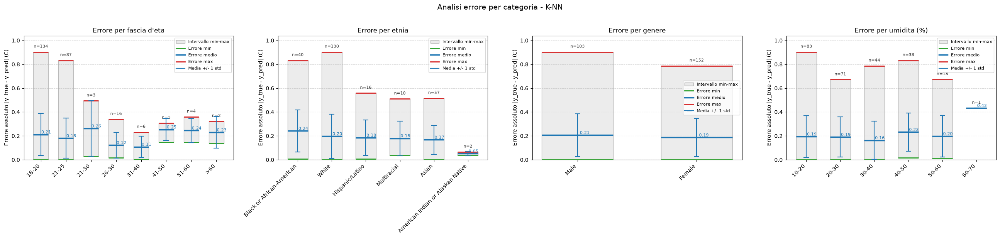


-- Errore assoluto per fascia d'eta --
          min    mean     max     std  count
Age                                         
18-20  0.0005  0.2114  0.9034  0.1763    134
21-25  0.0003  0.1800  0.8328  0.1684     87
21-30  0.0303  0.2616  0.4940  0.2319      3
26-30  0.0170  0.1224  0.3395  0.1081     16
31-40  0.0034  0.1084  0.2312  0.0900      6
41-50  0.1464  0.2534  0.3074  0.0926      3
51-60  0.1443  0.2445  0.3596  0.1009      4
>60    0.1353  0.2290  0.3227  0.1325      2

-- Errore assoluto per etnia --
                                      min    mean     max     std  count
Ethnicity                                                               
Black or African-American          0.0065  0.2412  0.8328  0.1769     40
White                              0.0005  0.1966  0.9034  0.1853    130
Hispanic/Latino                    0.0056  0.1841  0.5586  0.1498     16
Multiracial                        0.0342  0.1791  0.5107  0.1457     10
Asian                              0.00

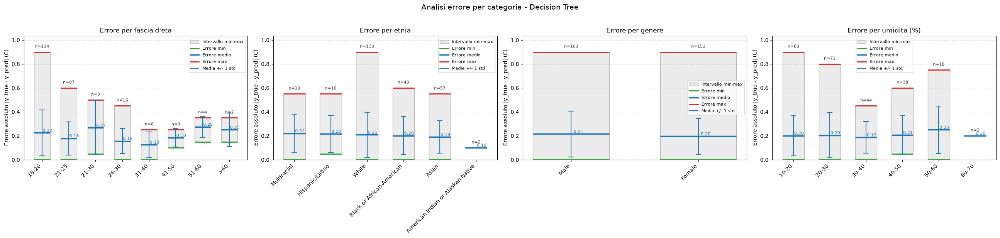


-- Errore assoluto per fascia d'eta --
        min    mean   max     std  count
Age                                     
18-20  0.00  0.2243  0.90  0.1930    134
21-25  0.00  0.1787  0.60  0.1384     87
21-30  0.05  0.2667  0.50  0.2255      3
26-30  0.00  0.1563  0.45  0.1047     16
31-40  0.00  0.1250  0.25  0.1084      6
41-50  0.10  0.1833  0.25  0.0764      3
51-60  0.15  0.2750  0.35  0.0866      4
>60    0.15  0.2500  0.35  0.1414      2

-- Errore assoluto per etnia --
                                    min    mean   max     std  count
Ethnicity                                                           
Multiracial                        0.00  0.2200  0.55  0.1602     10
Hispanic/Latino                    0.05  0.2156  0.55  0.1546     16
White                              0.00  0.2085  0.90  0.1881    130
Black or African-American          0.00  0.2013  0.60  0.1583     40
Asian                              0.00  0.1895  0.55  0.1355     57
American Indian or Alaskan Native 

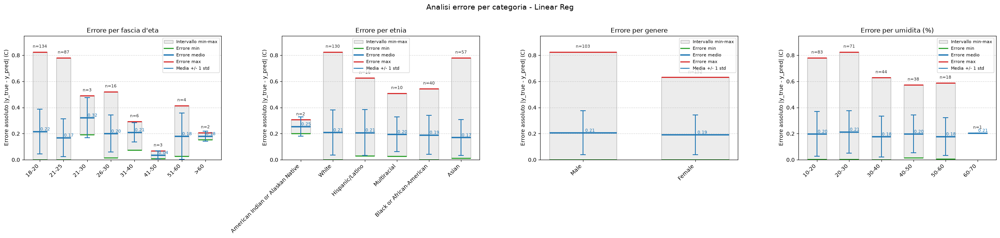


-- Errore assoluto per fascia d'eta --
          min    mean     max     std  count
Age                                         
18-20  0.0001  0.2162  0.8250  0.1715    134
21-25  0.0016  0.1689  0.7803  0.1451     87
21-30  0.1933  0.3220  0.4905  0.1526      3
26-30  0.0140  0.1998  0.5211  0.1417     16
31-40  0.0755  0.2100  0.2930  0.0727      6
41-50  0.0083  0.0360  0.0691  0.0307      3
51-60  0.0278  0.1800  0.4148  0.1761      4
>60    0.1525  0.1802  0.2078  0.0391      2

-- Errore assoluto per etnia --
                                      min    mean     max     std  count
Ethnicity                                                               
American Indian or Alaskan Native  0.2016  0.2543  0.3070  0.0745      2
White                              0.0001  0.2090  0.8250  0.1721    130
Hispanic/Latino                    0.0291  0.2082  0.6267  0.1769     16
Multiracial                        0.0278  0.1951  0.5084  0.1330     10
Black or African-American          0.00

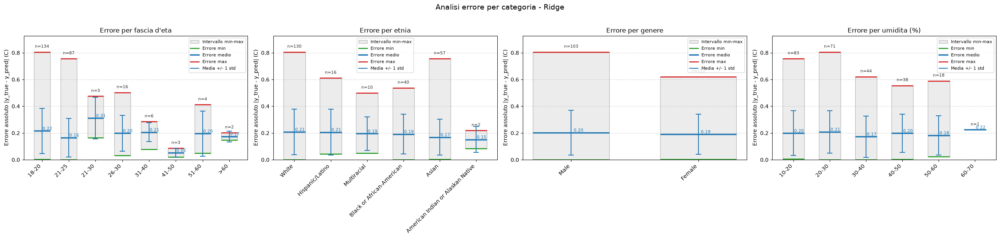


-- Errore assoluto per fascia d'eta --
          min    mean     max     std  count
Age                                         
18-20  0.0038  0.2153  0.8056  0.1693    134
21-25  0.0003  0.1648  0.7554  0.1437     87
21-30  0.1648  0.3108  0.4747  0.1557      3
26-30  0.0334  0.1980  0.5029  0.1334     16
31-40  0.0778  0.2056  0.2850  0.0704      6
41-50  0.0211  0.0519  0.0861  0.0326      3
51-60  0.0484  0.1954  0.4118  0.1681      4
>60    0.1459  0.1740  0.2021  0.0398      2

-- Errore assoluto per etnia --
                                      min    mean     max     std  count
Ethnicity                                                               
White                              0.0010  0.2075  0.8056  0.1699    130
Hispanic/Latino                    0.0446  0.2060  0.6107  0.1721     16
Multiracial                        0.0484  0.1950  0.4994  0.1267     10
Black or African-American          0.0003  0.1920  0.5369  0.1480     40
Asian                              0.00

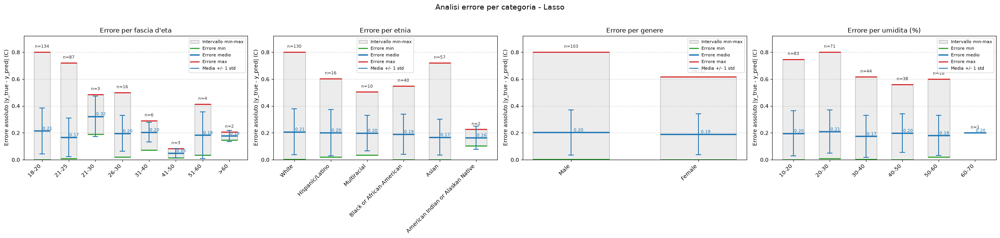


-- Errore assoluto per fascia d'eta --
          min    mean     max     std  count
Age                                         
18-20  0.0013  0.2146  0.8017  0.1714    134
21-25  0.0094  0.1663  0.7207  0.1429     87
21-30  0.1884  0.3230  0.4863  0.1510      3
26-30  0.0192  0.1958  0.5005  0.1333     16
31-40  0.0718  0.2044  0.2910  0.0730      6
41-50  0.0145  0.0490  0.0839  0.0347      3
51-60  0.0336  0.1826  0.4141  0.1748      4
>60    0.1480  0.1774  0.2068  0.0416      2

-- Errore assoluto per etnia --
                                      min    mean     max     std  count
Ethnicity                                                               
White                              0.0023  0.2082  0.8017  0.1713    130
Hispanic/Latino                    0.0201  0.2015  0.6035  0.1721     16
Multiracial                        0.0336  0.1988  0.5046  0.1314     10
Black or African-American          0.0013  0.1899  0.5484  0.1494     40
Asian                              0.00

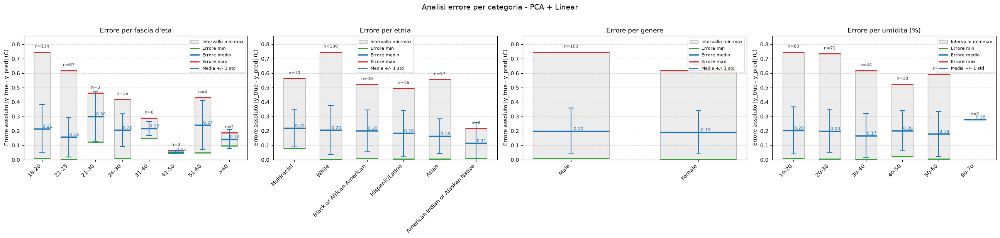


-- Errore assoluto per fascia d'eta --
          min    mean     max     std  count
Age                                         
18-20  0.0085  0.2148  0.7467  0.1671    134
21-25  0.0028  0.1574  0.6188  0.1380     87
21-30  0.1223  0.3001  0.4626  0.1707      3
26-30  0.0098  0.2047  0.4195  0.1141     16
31-40  0.1471  0.2169  0.2896  0.0490      6
41-50  0.0448  0.0545  0.0663  0.0109      3
51-60  0.0480  0.2409  0.4308  0.1693      4
>60    0.0974  0.1430  0.1886  0.0644      2

-- Errore assoluto per etnia --
                                      min    mean     max     std  count
Ethnicity                                                               
Multiracial                        0.0812  0.2190  0.5638  0.1316     10
White                              0.0028  0.2050  0.7467  0.1704    130
Black or African-American          0.0111  0.2016  0.5224  0.1436     40
Hispanic/Latino                    0.0061  0.1843  0.4952  0.1588     16
Asian                              0.00

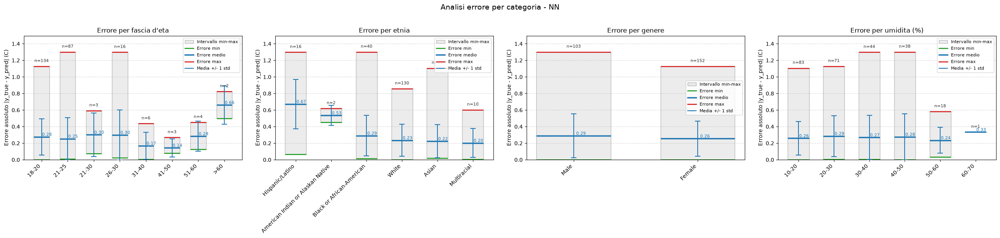


-- Errore assoluto per fascia d'eta --
          min    mean     max     std  count
Age                                         
18-20  0.0020  0.2759  1.1277  0.2174    134
21-25  0.0074  0.2541  1.3009  0.2532     87
21-30  0.0764  0.3016  0.5922  0.2640      3
26-30  0.0225  0.2990  1.2977  0.3013     16
31-40  0.0036  0.1685  0.4360  0.1621      6
41-50  0.0800  0.1432  0.2681  0.1082      3
51-60  0.1275  0.2839  0.4524  0.1800      4
>60    0.4971  0.6605  0.8240  0.2312      2

-- Errore assoluto per etnia --
                                      min    mean     max     std  count
Ethnicity                                                               
Hispanic/Latino                    0.0637  0.6721  1.2977  0.2976     16
American Indian or Alaskan Native  0.4503  0.5350  0.6197  0.1198      2
Black or African-American          0.0166  0.2900  1.3009  0.2454     40
White                              0.0020  0.2343  0.8573  0.1925    130
Asian                              0.01

In [59]:
# Errore per categoria demografica, per ogni modello (y predetta).
# y_test e le predizioni sono tutte allineate riga-per-riga a X_test_raw.
modelli_pred = {
    'K-NN':          y_pred_knn,
    'Decision Tree': y_pred_dt,
    'Linear Reg':    y_pred_lr,
    'Ridge':         y_pred_R,
    'Lasso':         y_pred_L,
    'PCA + Linear':  y_pred_PCA,
    'NN':            y_pred_NN,
}

for nome, y_hat in modelli_pred.items():
    print("=" * 80)
    print(f"MODELLO: {nome}")
    print("=" * 80)
    tab_eta, tab_eth, tab_gen, tab_hum = analisi_errore_demografico(
        y_test, y_hat, X_test_raw.index, X_cat_original, nome
    )
    print("\n-- Errore assoluto per fascia d'eta --")
    print(tab_eta.round(4).to_string())
    print("\n-- Errore assoluto per etnia --")
    print(tab_eth.round(4).to_string())
    print("\n-- Errore assoluto per genere --")
    print(tab_gen.round(4).to_string())
    print("\n-- Errore assoluto per umidità --")
    print(tab_hum.round(4).to_string())
    print()
